
#Assignment 4

*   Name: Anushka Rajesh Darade
*   NUID: 002734159



#Abstract

Alzheimer's disease (AD) is a neurodegenerative disorder of uncertain cause and pathogenesis that primarily affects older adults and is the most common cause of dementia. With this dataset we will classify if the person has dementia or not

#Variable Description

The dataset consists MRI related data that was generated by the Open Access Series of Imaging Studies (OASIS) project that is available on their website and kaggle.

*   EDUC: Years of Education
*   SES: Socioeconomic Status
*   MMSE: Mini Mental State Examination
*   CDR: Clinical Dementia Rating
*   eTIV: Estimated Total Intracranial Volume
*   nWBV: Normalize Whole Brain Volume
*   Age
*   Gender: Male or Female
*   ASF: Atlas Scaling Factor

#Importing required libraries

In [ ]:
#installing dependencies
!pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
%matplotlib inline

sns.set()

#Reading Dataset

Reading Data into Pandas Dataframe

In [ ]:
pandas_df = pd.read_csv("https://raw.githubusercontent.com/AnushkaDarade/DETECTING_EARLY_ALZHEIMER/main/oasis_longitudinal.csv")

In [ ]:
df01=pandas_df
df01

,Subject ID,MRI ID,Group,Visit,MR Delay,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
0,OAS2_0001,OAS2_0001_MR1,Nondemented,1,0,M,R,87,14,2.0,27.0,0.0,1987,0.696,0.883
1,OAS2_0001,OAS2_0001_MR2,Nondemented,2,457,M,R,88,14,2.0,30.0,0.0,2004,0.681,0.876
2,OAS2_0002,OAS2_0002_MR1,Demented,1,0,M,R,75,12,NaN,23.0,0.5,1678,0.736,1.046
3,OAS2_0002,OAS2_0002_MR2,Demented,2,560,M,R,76,12,NaN,28.0,0.5,1738,0.713,1.010
4,OAS2_0002,OAS2_0002_MR3,Demented,3,1895,M,R,80,12,NaN,22.0,0.5,1698,0.701,1.034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
368,OAS2_0185,OAS2_0185_MR2,Demented,2,842,M,R,82,16,1.0,28.0,0.5,1693,0.694,1.037
369,OAS2_0185,OAS2_0185_MR3,Demented,3,2297,M,R,86,16,1.0,26.0,0.5,1688,0.675,1.040
370,OAS2_0186,OAS2_0186_MR1,Nondemented,1,0,F,R,61,13,2.0,30.0,0.0,1319,0.801,1.331
371,OAS2_0186,OAS2_0186_MR2,Nondemented,2,763,F,R,63,13,2.0,30.0,0.0,1327,0.796,1.323


In [ ]:
pandas_df.head()

,Subject ID,MRI ID,Group,Visit,MR Delay,M/F,Hand,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF
0,OAS2_0001,OAS2_0001_MR1,Nondemented,1,0,M,R,87,14,2.0,27.0,0.0,1987,0.696,0.883
1,OAS2_0001,OAS2_0001_MR2,Nondemented,2,457,M,R,88,14,2.0,30.0,0.0,2004,0.681,0.876
2,OAS2_0002,OAS2_0002_MR1,Demented,1,0,M,R,75,12,NaN,23.0,0.5,1678,0.736,1.046
3,OAS2_0002,OAS2_0002_MR2,Demented,2,560,M,R,76,12,NaN,28.0,0.5,1738,0.713,1.010
4,OAS2_0002,OAS2_0002_MR3,Demented,3,1895,M,R,80,12,NaN,22.0,0.5,1698,0.701,1.034


#Removing rows with missing values by Imputation

The Socioeconomic Status (SES) is a discrete variable, we use median for the imputation. For the Mini Mental State Examination(MMSE) column we can replace empty spaces by mean values.

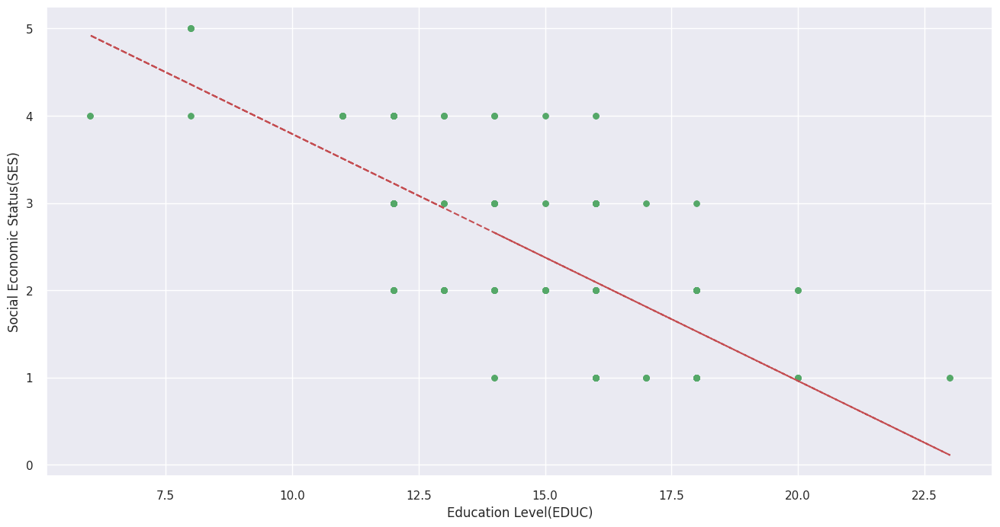

In [ ]:
# Draw scatter plot between EDUC and SES
x = pandas_df['EDUC']
y = pandas_df['SES']

ses_not_null_index = y[~y.isnull()].index
x = x[ses_not_null_index]
y = y[ses_not_null_index]

# Draw trend line in red
z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x, y, 'go', x, p(x), "r--")
plt.xlabel('Education Level(EDUC)')
plt.ylabel('Social Economic Status(SES)')

plt.show()

In [ ]:
pandas_df.groupby(['EDUC'])['SES'].median()

EDUC
6     4.0
8     5.0
11    4.0
12    3.0
13    2.0
14    3.0
15    2.0
16    2.0
17    1.0
18    2.0
20    1.0
23    1.0
Name: SES, dtype: float64

In [ ]:
pandas_df['SES'] = pandas_df["SES"].fillna(pandas_df.groupby("EDUC")["SES"].transform("median"))

we replaced the NaN value in SES with Median

In [ ]:
pandas_df.isna().sum()

Subject ID    0
MRI ID        0
Group         0
Visit         0
MR Delay      0
M/F           0
Hand          0
Age           0
EDUC          0
SES           0
MMSE          2
CDR           0
eTIV          0
nWBV          0
ASF           0
dtype: int64

We still have 2 rows with missing values in the Mini Mental State Examination(MMSE) column, we will fill the null values with mean.

In [ ]:
#Finding the mean of the column having NaN
mean_value=pandas_df['MMSE'].mean()

In [ ]:
pandas_df['MMSE'].fillna(value=mean_value, inplace=True)

In [ ]:
pandas_df.isnull().sum()

Subject ID    0
MRI ID        0
Group         0
Visit         0
MR Delay      0
M/F           0
Hand          0
Age           0
EDUC          0
SES           0
MMSE          0
CDR           0
eTIV          0
nWBV          0
ASF           0
dtype: int64

There are no missing values in our dataset now. Our dataset is clean now!

#Data transforming, Feature creation and Analysis

In [ ]:
pandas_df = pandas_df.loc[pandas_df['Visit']==1] # use first visit data only because of the analysis we're doing
pandas_df = pandas_df.reset_index(drop=True) # reset index after filtering first visit data

pandas_df['Group'] = pandas_df['Group'].replace(['Converted'], ['Demented']) # Target variable
pandas_df['Group'] = pandas_df['Group'].replace(['Demented', 'Nondemented'], [1,0]) # Target variable
pandas_df = pandas_df.drop(['MRI ID', 'Visit', 'Hand'], axis=1) # Drop unnecessary columns

##One Hot Encoding

In [ ]:
# Perform one-hot encoding on the 'sex' column
sex_encoded = pd.get_dummies(pandas_df['M/F'], prefix='Sex')
# Concatenate the encoded column with the original dataframe
pandas_df = pd.concat([pandas_df, sex_encoded], axis=1)
# Dropping the original 'Sex' column
pandas_df.drop(['M/F'], axis=1, inplace=True)

In [ ]:
pandas_df["Sex_F"]=pandas_df["Sex_F"].astype(int)
pandas_df["Sex_M"]=pandas_df["Sex_M"].astype(int)
pandas_df

,Subject ID,Group,MR Delay,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF,Sex_F,Sex_M
0,OAS2_0001,0,0,87,14,2.0,27.0,0.0,1987,0.696,0.883,0,1
1,OAS2_0002,1,0,75,12,3.0,23.0,0.5,1678,0.736,1.046,0,1
2,OAS2_0004,0,0,88,18,3.0,28.0,0.0,1215,0.710,1.444,1,0
3,OAS2_0005,0,0,80,12,4.0,28.0,0.0,1689,0.712,1.039,0,1
4,OAS2_0007,1,0,71,16,2.0,28.0,0.5,1357,0.748,1.293,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,OAS2_0182,1,0,73,12,3.0,23.0,0.5,1661,0.698,1.056,0,1
146,OAS2_0183,0,0,66,13,2.0,30.0,0.0,1495,0.746,1.174,1,0
147,OAS2_0184,1,0,72,16,3.0,24.0,0.5,1354,0.733,1.296,1,0
148,OAS2_0185,1,0,80,16,1.0,28.0,0.5,1704,0.711,1.030,0,1


Text(0.5, 1.0, 'Demented and Nondemented rate in male patients')

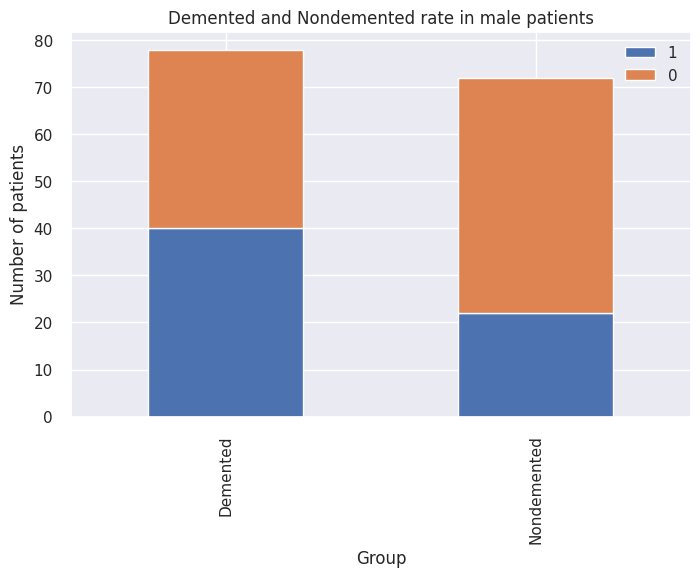

In [ ]:
# Gender  and  Group ( Female=0, Male=1)
def bar_chart(feature):
    Demented = pandas_df[pandas_df['Group']==1][feature].value_counts()
    Nondemented = pandas_df[pandas_df['Group']==0][feature].value_counts()
    df_bar = pd.DataFrame([Demented,Nondemented])
    df_bar.index = ['Demented','Nondemented']
    df_bar.plot(kind='bar',stacked=True, figsize=(8,5))

bar_chart('Sex_M')
plt.xlabel('Group')
plt.ylabel('Number of patients')
plt.legend()
plt.title('Demented and Nondemented rate in male patients')


There are more male patients in the demented category compared to non demented category.

Text(0.5, 1.0, 'Demented and Nondemented rate in female patients')

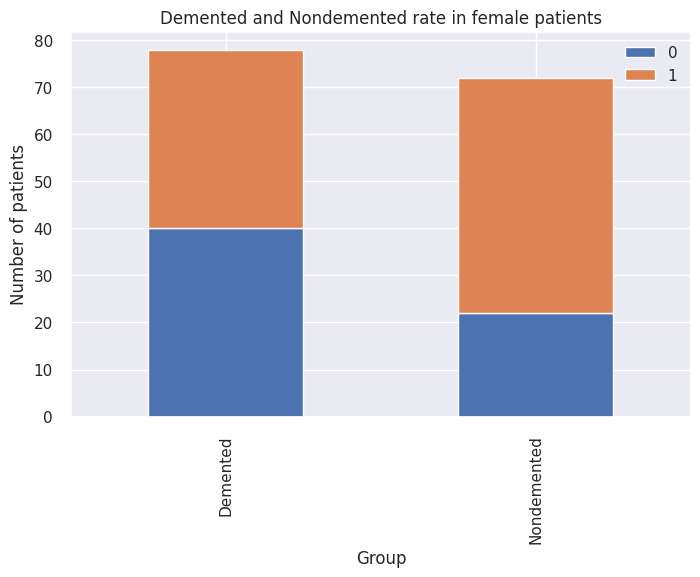

In [ ]:
bar_chart('Sex_F')
plt.xlabel('Group')
plt.ylabel('Number of patients')
plt.legend()
plt.title('Demented and Nondemented rate in female patients')

The above graph indicates that men are more likely with dementia than women.


(15.3, 30.0)

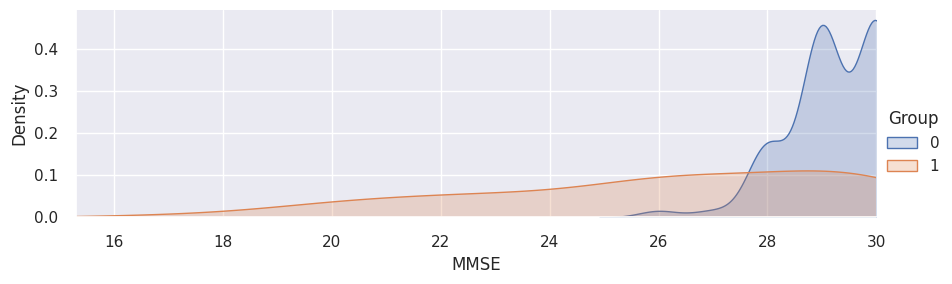

In [ ]:
#MMSE : Mini Mental State Examination
# Nondemented = 0, Demented =1
# Nondemented has higher test result ranging from 25 to 30.
#Min 17 ,MAX 30
facet= sns.FacetGrid(pandas_df,hue="Group", aspect=3)
facet.map(sns.kdeplot,'MMSE',shade= True)
facet.set(xlim=(0, pandas_df['MMSE'].max()))
facet.add_legend()
plt.xlim(15.30)

The chart shows Nondemented group got much more higher Mini Mental State Examination (MMSE) scores than Demented group.

(0.6, 0.9)

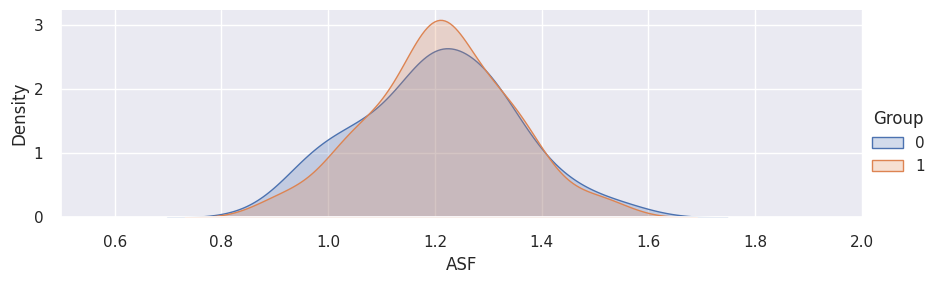

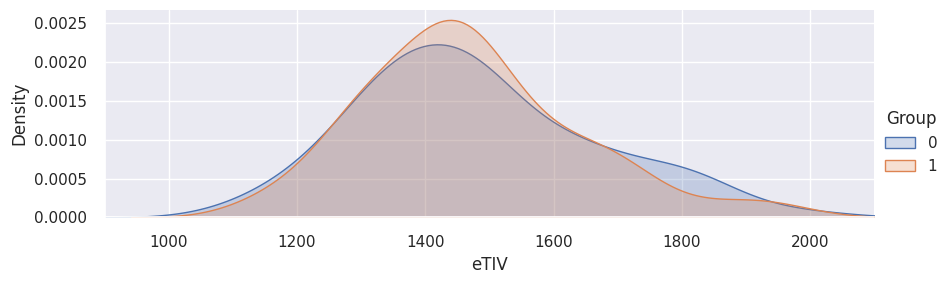

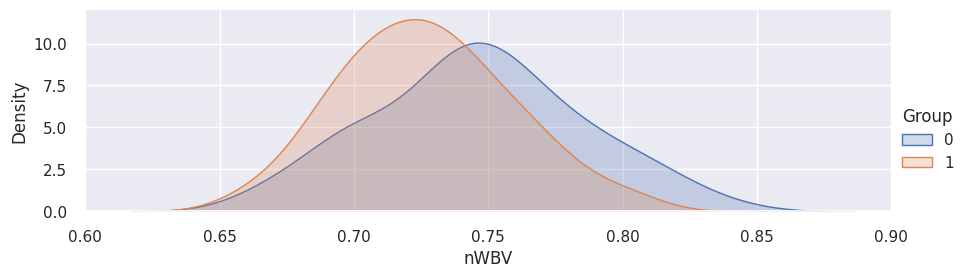

In [ ]:
#bar_chart('ASF') = Atlas Scaling Factor
facet= sns.FacetGrid(pandas_df,hue="Group", aspect=3)
facet.map(sns.kdeplot,'ASF',shade= True)
facet.set(xlim=(0, pandas_df['ASF'].max()))
facet.add_legend()
plt.xlim(0.5, 2)

#eTIV = Estimated Total Intracranial Volume
facet= sns.FacetGrid(pandas_df,hue="Group", aspect=3)
facet.map(sns.kdeplot,'eTIV',shade= True)
facet.set(xlim=(0, pandas_df['eTIV'].max()))
facet.add_legend()
plt.xlim(900, 2100)

#'nWBV' = Normalized Whole Brain Volume
# Nondemented = 0, Demented =1
facet= sns.FacetGrid(pandas_df,hue="Group", aspect=3)
facet.map(sns.kdeplot,'nWBV',shade= True)
facet.set(xlim=(0, pandas_df['nWBV'].max()))
facet.add_legend()
plt.xlim(0.6,0.9)

The chart indicates that Nondemented group has higher brain volume ratio than Demented group. This is assumed to be because the diseases affect the brain to be shrinking its tissue.

<Figure size 800x500 with 0 Axes>

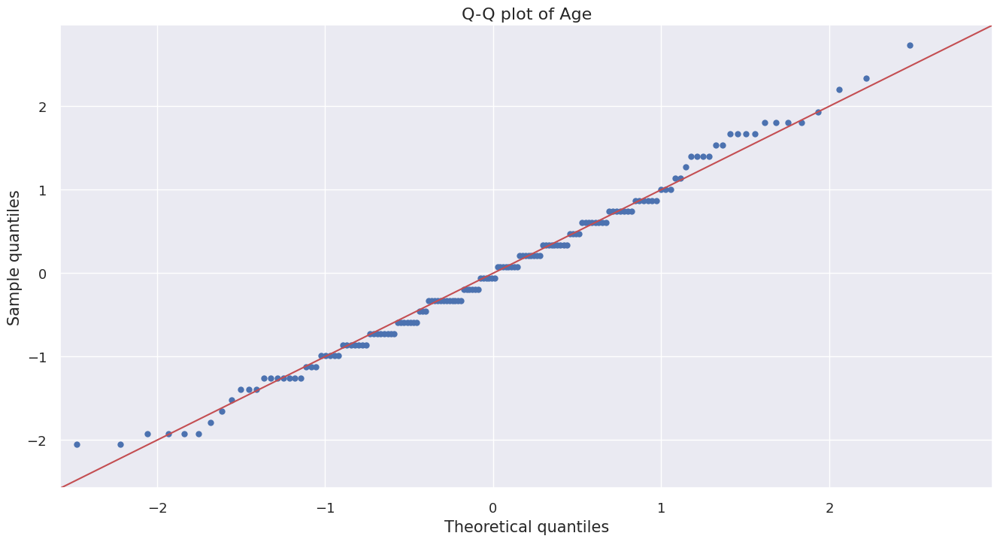

<Figure size 800x500 with 0 Axes>

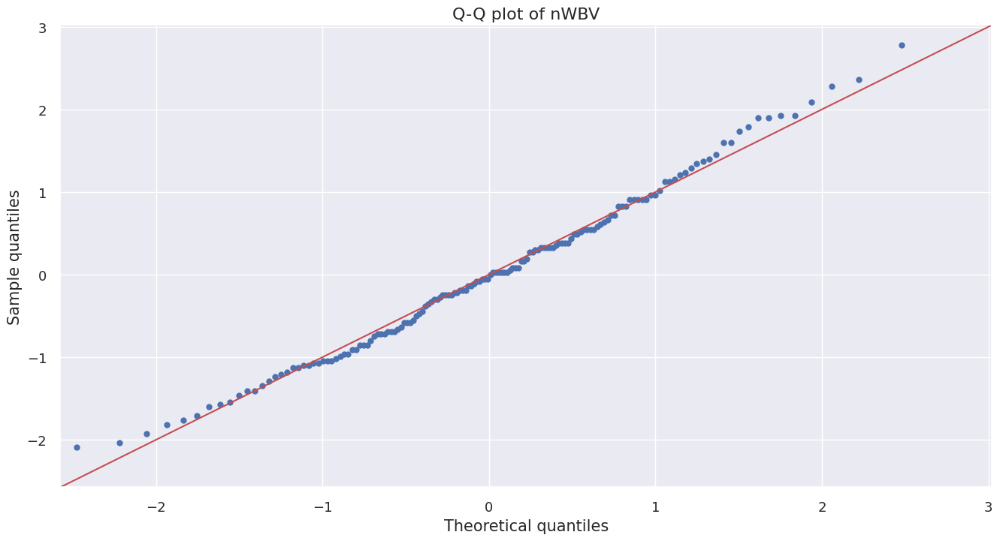

<Figure size 800x500 with 0 Axes>

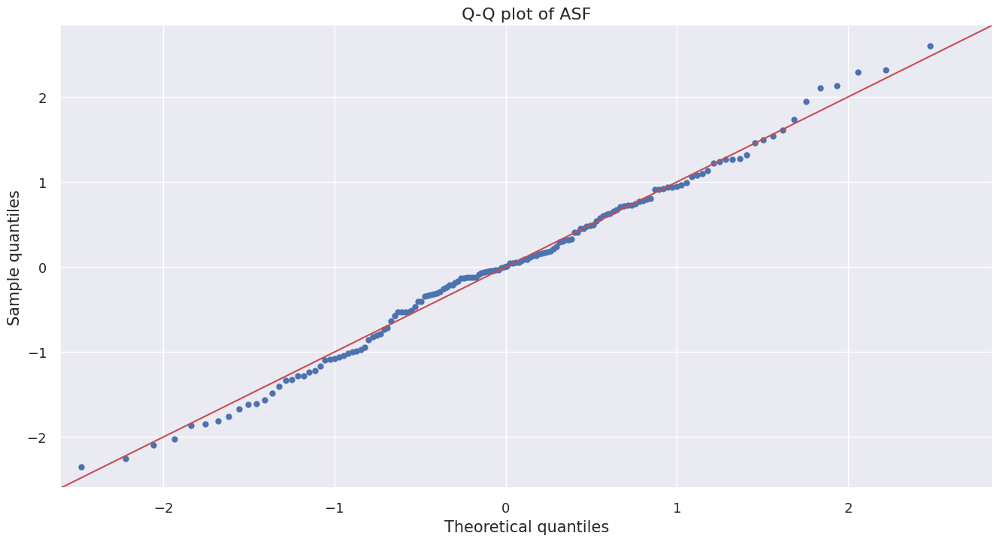

<Figure size 800x500 with 0 Axes>

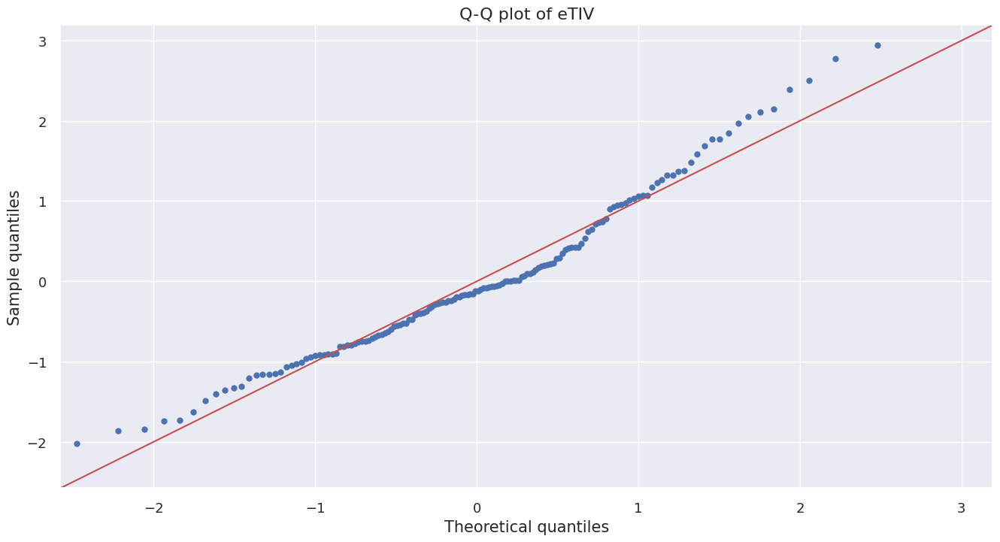

<Figure size 800x500 with 0 Axes>

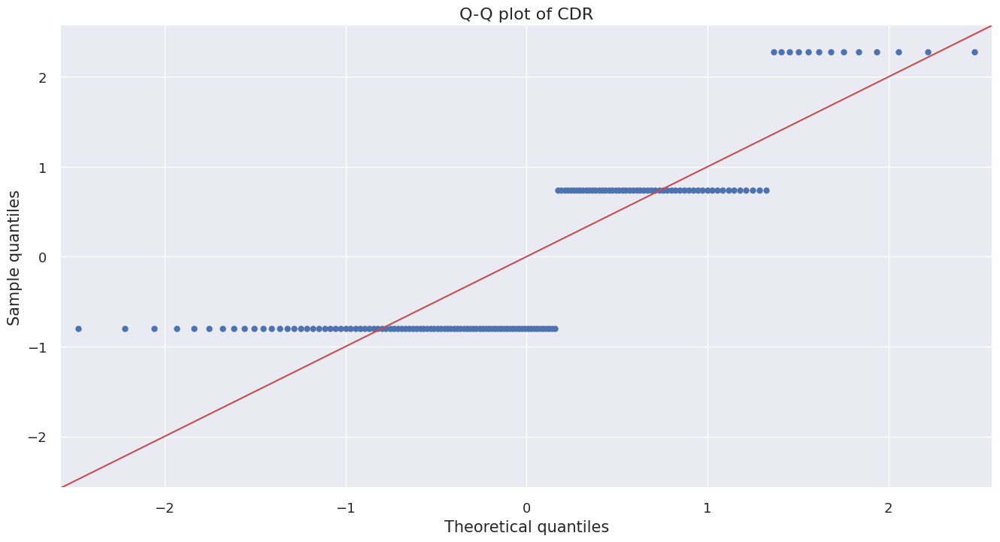

In [ ]:
#checking the distribution of independent variables
from statsmodels.graphics.gofplots import qqplot
data_norm=pandas_df[['Age','nWBV','ASF','eTIV','CDR']]
for c in data_norm.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

1. Looking at the Q-Q plot above, it appears that all independent variables are roughly following normal distribution
2. There are few outliers in few of the predictor variables like in MR Delay and age
3. Other variable like Years of Education (EDUC), Socioeconomic Status (SES), M/F are categorical and hence not plotted them.

(50.0, 100.0)

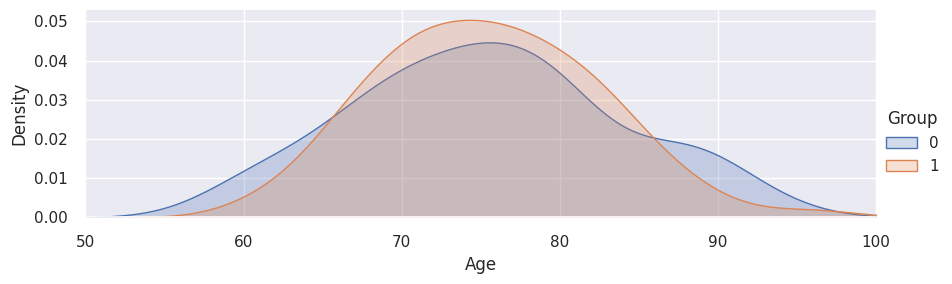

In [ ]:
#AGE. Nondemented =0, Demented =1
facet= sns.FacetGrid(pandas_df,hue="Group", aspect=3)
facet.map(sns.kdeplot,'Age',shade= True)
facet.set(xlim=(0, pandas_df['Age'].max()))
facet.add_legend()
plt.xlim(50,100)

There is a higher concentration of 70-80 years old in the Demented patient group than those in the nondemented patients. We guess patients who suffered from that kind of disease has lower survival rate so that there are a few of 90 years old.

(0.0, 0.16)

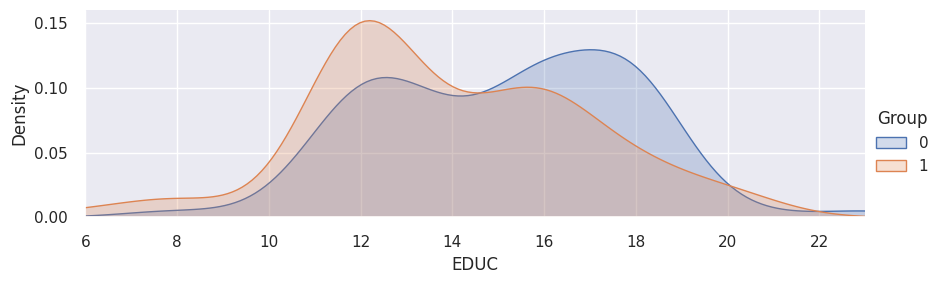

In [ ]:
#'EDUC' = Years of Education
# Nondemented = 0, Demented =1
facet= sns.FacetGrid(pandas_df,hue="Group", aspect=3)
facet.map(sns.kdeplot,'EDUC',shade= True)
facet.set(xlim=(pandas_df['EDUC'].min(), pandas_df['EDUC'].max()))
facet.add_legend()
plt.ylim(0, 0.16)

Intermediate Result Summary
1. Men are more likely with demented, an Alzheimer's Disease, than Women.
2. Demented patients were less educated in terms of years of education.
3. Nondemented group has higher brain volume than Demented group.
4. Higher concentration of 70-80 years old in Demented group than those in the nondemented patients.

#Analysing Relationship between all variables

The correlation matrix is simply a table of correlations.Each random variable in the table is correlated with each of the other values in the table. This allows us to see which pairs have the highest correlation.It also tells us if it is directly dependent or inversely by signifying the positive and negative signs.

This is one of the methhod that will tell us which independent variables are useful to predict a target variable. Other than correlation matrix other methods which help us to determine independent variable importance are pairplot against the target variable and calculating p-value.

In [ ]:
df_1=pandas_df.drop(['MR Delay'], axis=1, inplace=False)
df_1.corr()

,Group,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF,Sex_F,Sex_M
Group,1.000000,0.002058,-0.212378,0.084437,-0.530773,0.768221,-0.031369,-0.265774,0.021365,-0.210282,0.210282
Age,0.002058,1.000000,-0.065513,-0.012407,-0.022629,-0.039313,-0.009693,-0.558027,0.020708,0.062457,-0.062457
EDUC,-0.212378,-0.065513,1.000000,-0.727861,0.216439,-0.227556,0.236263,0.048484,-0.218819,-0.070563,0.070563
SES,0.084437,-0.012407,-0.727861,1.000000,-0.186673,0.148746,-0.235439,0.022244,0.226172,0.034792,-0.034792
MMSE,-0.530773,-0.022629,0.216439,-0.186673,1.000000,-0.691874,-0.051549,0.322025,0.059661,0.218365,-0.218365
CDR,0.768221,-0.039313,-0.227556,0.148746,-0.691874,1.000000,0.037608,-0.310813,-0.039840,-0.203178,0.203178
eTIV,-0.031369,-0.009693,0.236263,-0.235439,-0.051549,0.037608,1.000000,-0.195254,-0.988228,-0.571898,0.571898
nWBV,-0.265774,-0.558027,0.048484,0.022244,0.322025,-0.310813,-0.195254,1.000000,0.190626,0.241635,-0.241635
ASF,0.021365,0.020708,-0.218819,0.226172,0.059661,-0.039840,-0.988228,0.190626,1.000000,0.564241,-0.564241
Sex_F,-0.210282,0.062457,-0.070563,0.034792,0.218365,-0.203178,-0.571898,0.241635,0.564241,1.000000,-1.000000


Representing the same matrix in form of heatmap where shades of blue signify inverse relation and shades of red signify direct relation.

Text(0.5, 1.0, 'Variable Correlation')

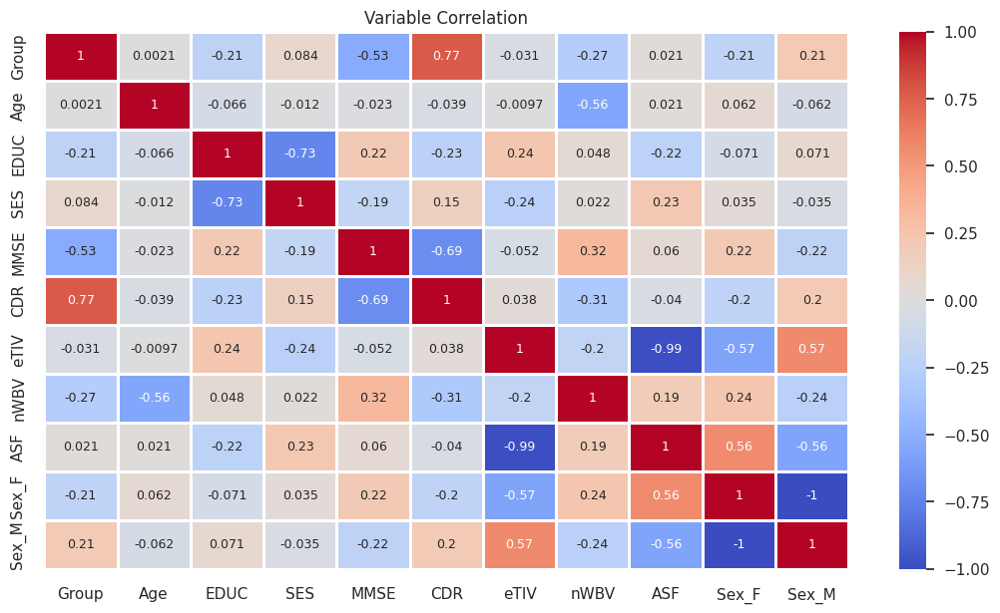

In [ ]:
#heatmap
from IPython.core.pylabtools import figsize
f,ax=plt.subplots(figsize=(13,7))

sns.heatmap(df_1.corr(),center=0, linewidths=0.9,cmap='coolwarm',annot=True, annot_kws={"size": 9})
plt.title('Variable Correlation')

##Correlation Analysis
In the above heatmap, we can see the correlation coeeficients as colors in a matrix, indicates the strength of correlation between correspnding variables.

1. Group and CDR is highly correlated
2. eTIV and Sex_M are highly correlated

Plotting all variables against other variables to see if relation exists between them. Basically it tells the same thing as correlation matrix but in a graphical way.

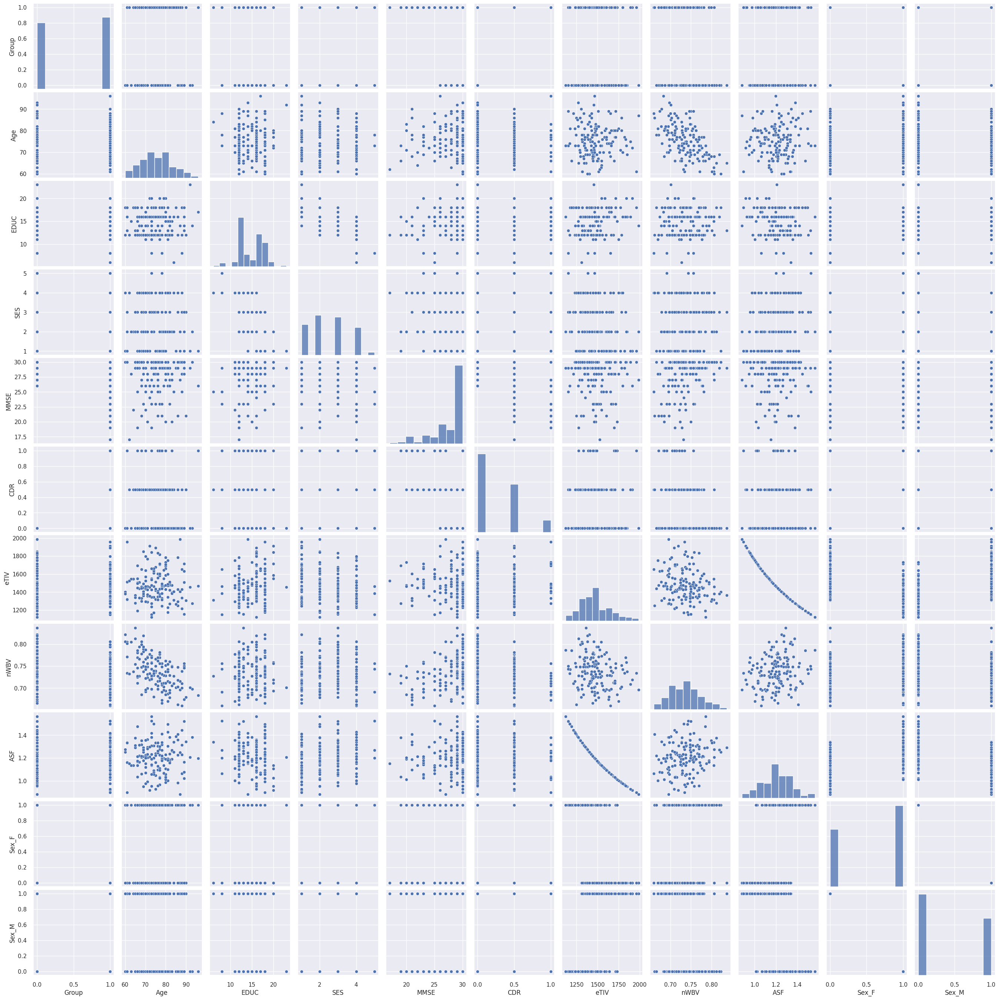

In [ ]:
sns.pairplot(df_1)

From the above pairplot we can see that

1. ASF(Atlas Scaling Factor), eTIV(Estimated Total Intracranial Volume), nWBV(Normalize Whole Brain Volume) and Age follows normal distribution since their histogram is bell-shaped.
2. The list of skewed variables are: CDR (Clinical Dementia Rating), MMSE (Mini Mental State Examination) and SES(Socioeconomic Status )
3. There is a strong linear correlation between ASF(Atlas Scaling Factor) and nWBV(Normalize Whole Brain Volume)

#VIF and p value

To calculate the p-value and VIF we need to seperate the target variable from the independent ones. Then later we need to seperate the data into testing and training dataset.

In [ ]:
# the independent variables set
X = pandas_df[['Age','EDUC','SES','MMSE','CDR','eTIV','nWBV','ASF']]

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X.values, i)
                          for i in range(len(X.columns))]

print(vif_data)

  feature         VIF
0     Age  160.235246
1    EDUC   60.927657
2     SES   13.598182
3    MMSE  176.461675
4     CDR    3.360059
5    eTIV  355.504048
6    nWBV  712.897443
7     ASF  450.129220


As we can see ASF, Estimated Total Intracranial Volume (eTIV), Age, Mini Mental State Examination (MMSE) and nWBC have very high values of VIF, indicating that these variables are highly correlated. This is expected as the age of a person does influence the factor that they have dementia. Hence, considering these features together leads to a model with high multicollinearity.

#Building the Model

##Splitting Train/Validation/Test Sets

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import cross_val_score

In [ ]:
# Dataset with imputation
Y = pandas_df['Group'].values # Target for the model
X = pandas_df[[ 'Age', 'EDUC', 'SES', 'MMSE', 'eTIV', 'nWBV', 'ASF','CDR','Sex_M','Sex_F']] # Features we use

#Validation/Train set 85% && Test set 15%

# splitting into three sets
X_trainval, X_test, Y_trainval, Y_test = train_test_split(X, Y, test_size=0.15, random_state=1)

# Feature scaling
scaler = MinMaxScaler().fit(X_trainval)
X_trainval_scaled = scaler.transform(X_trainval)
X_test_scaled = scaler.transform(X_test)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, roc_curve, auc

In [ ]:
acc = [] # list to store all performance metric

#Logistic Regression

In [ ]:
# Dataset with imputation
best_score=0
kfolds=5 # set the number of folds

for c in [0.001]:
    logRegModel = LogisticRegression(C=c)
    # perform cross-validation
    scores = cross_val_score(logRegModel, X_trainval, Y_trainval, cv=kfolds, scoring='accuracy') # Get recall for each parameter setting

    # compute mean cross-validation accuracy
    score = np.mean(scores)

    # Find the best parameters and score
    if score > best_score:
        best_score = score
        best_parameters = c

# rebuild a model on the combined training and validation set
SelectedLogRegModel = LogisticRegression(C=best_parameters, max_iter=000).fit(X_trainval_scaled, Y_trainval)

test_score = SelectedLogRegModel.score(X_test_scaled, Y_test)
PredictedOutput = SelectedLogRegModel.predict(X_test_scaled)
test_recall = recall_score(Y_test, PredictedOutput, pos_label=1)
fpr, tpr, thresholds = roc_curve(Y_test, PredictedOutput, pos_label=1)
test_auc = auc(fpr, tpr)
print("Best accuracy on validation set is:", best_score)
print("Best parameter for regularization (C) is: ", best_parameters)
print("Test accuracy with best C parameter is", test_score)
print("Test recall with the best C parameter is", test_recall)
print("Test AUC with the best C parameter is", test_auc)
m = 'Logistic Regression (w imputation)'
acc.append([m, test_score, test_recall, test_auc, fpr, tpr, thresholds])

Best accuracy on validation set is: 0.6772307692307693
Best parameter for regularization (C) is:  0.001
Test accuracy with best C parameter is 0.6521739130434783
Test recall with the best C parameter is 0.7272727272727273
Test AUC with the best C parameter is 0.6553030303030303


#Decision Tree

Maximum depth. [1, 2, ..., 8]

8 is the number of features

In [ ]:
best_score = 0
kfolds=5 # set the number of folds

for md in range(1, 9): # iterate different maximum depth values
    # train the model
    treeModel = DecisionTreeClassifier(random_state=0, max_depth=md, criterion='gini')
    # perform cross-validation
    scores = cross_val_score(treeModel, X_trainval_scaled, Y_trainval, cv=kfolds, scoring='accuracy')

    # compute mean cross-validation accuracy
    score = np.mean(scores)

    # if we got a better score, store the score and parameters
    if score > best_score:
        best_score = score
        best_parameter = md

# Rebuild a model on the combined training and validation set
SelectedDTModel = DecisionTreeClassifier(max_depth=best_parameter).fit(X_trainval_scaled, Y_trainval )

test_score = SelectedDTModel.score(X_test_scaled, Y_test)
PredictedOutput = SelectedDTModel.predict(X_test_scaled)
test_recall = recall_score(Y_test, PredictedOutput, pos_label=1)
fpr, tpr, thresholds = roc_curve(Y_test, PredictedOutput, pos_label=1)
test_auc = auc(fpr, tpr)
y_pred = SelectedDTModel.predict(X_test_scaled)
print("Best accuracy on validation set is:", best_score)
print("Best parameter for the maximum depth is: ", best_parameter)
print("Test accuracy with best parameter is ", test_score)
print("Test recall with best parameters is ", test_recall)
print("Test AUC with the best parameter is ", test_auc)
print("Accuracy score ", accuracy_score(y_pred,Y_test))

m = 'Decision Tree'
acc.append([m, test_score, test_recall, test_auc, fpr, tpr, thresholds])

Best accuracy on validation set is: 0.9295384615384616
Best parameter for the maximum depth is:  1
Test accuracy with best parameter is  0.8260869565217391
Test recall with best parameters is  0.6363636363636364
Test AUC with the best parameter is  0.8181818181818181
Accuracy score  0.8260869565217391


In [ ]:
print("Feature importance: ")
np.array([X.columns.values.tolist(), list(SelectedDTModel.feature_importances_)]).T

Feature importance: 


array([['Age', '0.0'],
       ['EDUC', '0.0'],
       ['SES', '0.0'],
       ['MMSE', '0.0'],
       ['eTIV', '0.0'],
       ['nWBV', '0.0'],
       ['ASF', '0.0'],
       ['CDR', '1.0'],
       ['Sex_M', '0.0'],
       ['Sex_F', '0.0']], dtype='<U32')

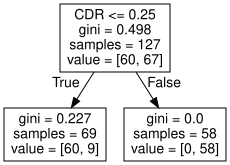

In [ ]:
from sklearn.tree import export_graphviz
import graphviz
dot_data=export_graphviz(SelectedDTModel, feature_names=X_trainval.columns.values.tolist(),out_file=None)
graph = graphviz.Source(dot_data)
graph

#Random Forest Clasifier

n_estimators(M): the number of trees in the forest

max_features(d): the number of features to consider when looking for the best split

max_depth(m): the maximum depth of the tree.

In [ ]:
best_score = 0

for M in range(2, 15, 2): # combines M trees
    for d in range(1, 9): # maximum number of features considered at each split
        for m in range(1, 9): # maximum depth of the tree
            # train the model
            # n_jobs(4) is the number of parallel computing
            forestModel = RandomForestClassifier(n_estimators=M, max_features=d, n_jobs=4,
                                          max_depth=m, random_state=0)

            # perform cross-validation
            scores = cross_val_score(forestModel, X_trainval_scaled, Y_trainval, cv=kfolds, scoring='accuracy')

            # compute mean cross-validation accuracy
            score = np.mean(scores)

            # if we got a better score, store the score and parameters
            if score > best_score:
                best_score = score
                best_M = M
                best_d = d
                best_m = m

# Rebuild a model on the combined training and validation set
SelectedRFModel = RandomForestClassifier(n_estimators=M, max_features=d,
                                          max_depth=m, random_state=0).fit(X_trainval_scaled, Y_trainval )

PredictedOutput = SelectedRFModel.predict(X_test_scaled)
test_score = SelectedRFModel.score(X_test_scaled, Y_test)
test_recall = recall_score(Y_test, PredictedOutput, pos_label=1)
fpr, tpr, thresholds = roc_curve(Y_test, PredictedOutput, pos_label=1)
test_auc = auc(fpr, tpr)
print("Best accuracy on validation set is:", best_score)
print("Best parameters of M, d, m are: ", best_M, best_d, best_m)
print("Test accuracy with the best parameters is", test_score)
print("Test recall with the best parameters is:", test_recall)
print("Test AUC with the best parameters is:", test_auc)

m = 'Random Forest'
acc.append([m, test_score, test_recall, test_auc, fpr, tpr, thresholds])

Best accuracy on validation set is: 0.9535384615384614
Best parameters of M, d, m are:  8 4 5
Test accuracy with the best parameters is 0.782608695652174
Test recall with the best parameters is: 0.6363636363636364
Test AUC with the best parameters is: 0.7765151515151514


In [ ]:
print("Feature importance: ")
np.array([X.columns.values.tolist(), list(SelectedRFModel.feature_importances_)]).T

Feature importance: 


array([['Age', '0.029087159057354706'],
       ['EDUC', '0.03985192099781957'],
       ['SES', '0.017739060759323636'],
       ['MMSE', '0.05123871822251616'],
       ['eTIV', '0.04675922316406385'],
       ['nWBV', '0.05781640983297843'],
       ['ASF', '0.03117968998751593'],
       ['CDR', '0.7260633668706482'],
       ['Sex_M', '0.0002644511077794441'],
       ['Sex_F', '0.0']], dtype='<U32')

# Identifing predictor significance

In [ ]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(pandas_df['Group'], pandas_df[['Age','EDUC','SES','CDR','MMSE','eTIV','nWBV','ASF','Sex_M','Sex_F']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Group   R-squared:                       0.620
Model:                            OLS   Adj. R-squared:                  0.595
Method:                 Least Squares   F-statistic:                     25.36
Date:                Mon, 10 Apr 2023   Prob (F-statistic):           2.12e-25
Time:                        02:06:21   Log-Likelihood:                -36.217
No. Observations:                 150   AIC:                             92.43
Df Residuals:                     140   BIC:                             122.5
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Age            0.0020      0.004      0.450      0.653      -0.007       0.011
EDUC          -0.0201      0.014     -1.466      0.145      -0.047       0.007
SES           -0.0635      0.035     -1.806      0.073      -0.133       0.006
CDR            1.1471      0.116      9.930      0.000       0.919       1.375
MMSE           0.0027      0.013      0.214      0.831      -0.022       0.027
eTIV          -0.0013      0.001     -1.346      0.180      -0.003       0.001
nWBV          -0.0928      0.998     -0.093      0.926      -2.066       1.880
ASF           -1.1634      1.253     -0.928      0.355      -3.641       1.314
Sex_M          3.9963      3.074      1.300      0.196      -2.081      10.074
Sex_F          3.8406      3.073      1.250      0.213      -2.234       9.916
==============================================================================
Omnibus:                       23.284   Durbin-Watson:                   1.826
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               28.702
Skew:                           1.032   Prob(JB):                     5.85e-07
Kurtosis:                       3.579   Cond. No.                     2.58e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.58e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

* CDR has the p-value 0, which is lesser and hence it is a significant feature.
* The second significant feature is SES that has p-value 0.073.
* The third significant feature is eTIV that has p-value 0.180.
* The features that have p-value greater than 0 are non significant features.

In [ ]:
#Understanding the important features
import eli5
from eli5.sklearn import PermutationImportance
perm = PermutationImportance(SelectedRFModel , random_state=1).fit(X_test_scaled, Y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.3826 ± 0.1014,CDR
0 ± 0.0000,Sex_F
0 ± 0.0000,Sex_M
0 ± 0.0000,ASF
0 ± 0.0000,nWBV
0 ± 0.0000,SES
-0.0087 ± 0.0348,EDUC
-0.0174 ± 0.0426,Age
-0.0435 ± 0.0000,eTIV
-0.0435 ± 0.0000,MMSE


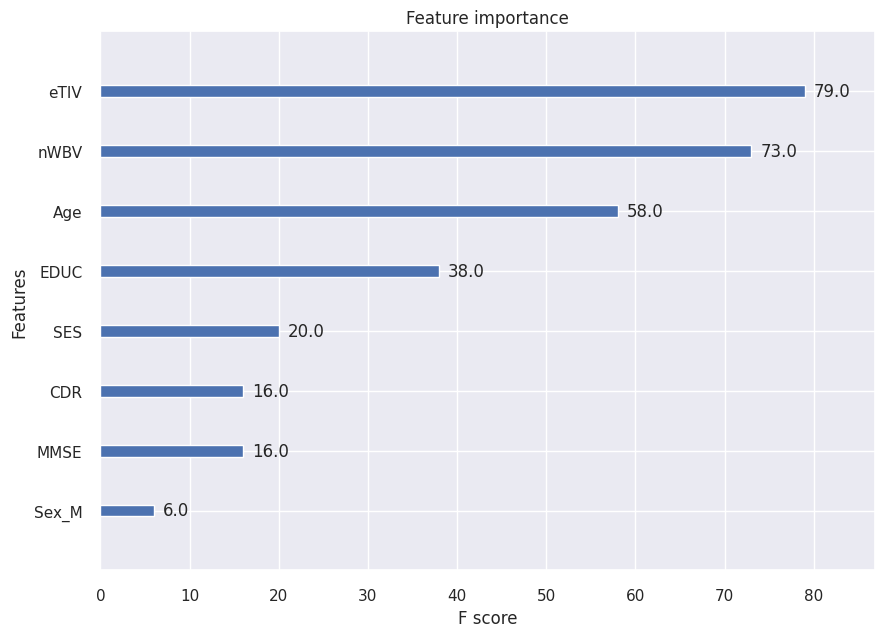

In [ ]:
#feature importance with xgboost classifier
from numpy import loadtxt
from xgboost import XGBClassifier
from xgboost import plot_importance
from matplotlib import pyplot

model = XGBClassifier()
model.fit(X_trainval, Y_trainval)

# plot feature importance
ax = plot_importance(model)
fig = ax.figure
fig.set_size_inches(10, 7)
#plot_importance(model)
pyplot.show()

This graph gives feature importance based on F score. It accordingly ranks features as: Estimated Total Intracranial Volume 'eTIV', 'Age', Normalize Whole Brain Volume 'nWBV', Clinical Dementia Rating 'CDR',Years of Education 'EDUC', Socioeconomic Status 'SES', Mini Mental State Examination'MMSE' and 'Sex_M'

# Checking Range of variables and Outliers

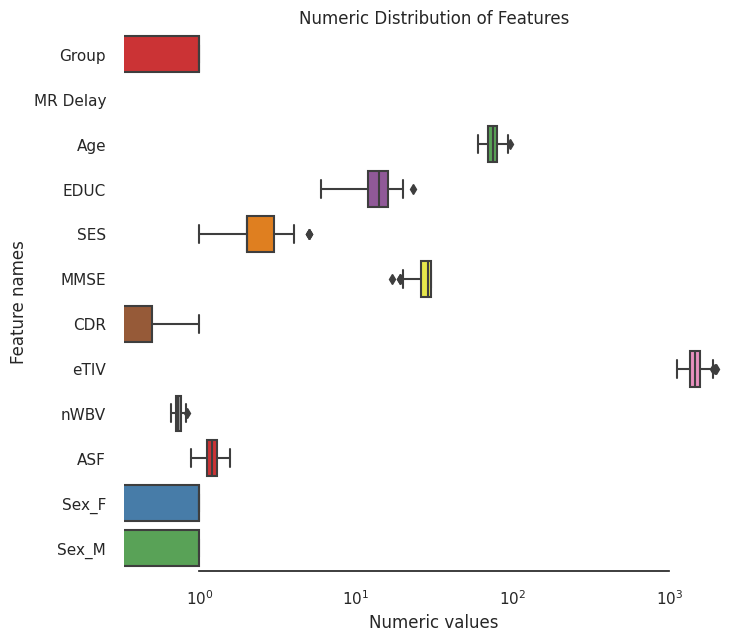

In [ ]:
#Checking the range of predictor/independent variable
sns.set_style("white")
f, ax = plt.subplots(figsize=(8, 7))
ax.set_xscale("log")
ax = sns.boxplot(data=pandas_df, orient="h", palette="Set1")
ax.xaxis.grid(False)
ax.set(ylabel="Feature names")
ax.set(xlabel="Numeric values")
ax.set(title="Numeric Distribution of Features")
sns.despine(trim=True, left=True)

Now it is clear to visualize and interpret the data. Looking at the boxplot above, we can infer below:

Sex have two categorical values - Male, Female and they are almost evenly distributed meaning almost same number of Male and Female.

Since there are not many outliers in my dataset, it won't affect my final predictive model.

# Removing 1%, 5%, and 10% of data randomly and imputing the values back

In [ ]:
df_ASF = pandas_df[['ASF']]
df_ASF['ASF_copy_1_percent'] = df_ASF[['ASF']]
df_ASF['ASF_copy_5_percent'] = df_ASF[['ASF']]
df_ASF['ASF_copy_10_percent'] = df_ASF[['ASF']]
df_ASF

,ASF,ASF_copy_1_percent,ASF_copy_5_percent,ASF_copy_10_percent
0,0.883,0.883,0.883,0.883
1,1.046,1.046,1.046,1.046
2,1.444,1.444,1.444,1.444
3,1.039,1.039,1.039,1.039
4,1.293,1.293,1.293,1.293
...,...,...,...,...
145,1.056,1.056,1.056,1.056
146,1.174,1.174,1.174,1.174
147,1.296,1.296,1.296,1.296
148,1.030,1.030,1.030,1.030


Check % missing values in this dataframe

In [ ]:
def get_percent_missing(dataframe):

    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame({'column_name': dataframe.columns,
                                     'percent_missing': percent_missing})
    return missing_value_df

In [ ]:
print(get_percent_missing(df_ASF))

                             column_name  percent_missing
ASF                                  ASF              0.0
ASF_copy_1_percent    ASF_copy_1_percent              0.0
ASF_copy_5_percent    ASF_copy_5_percent              0.0
ASF_copy_10_percent  ASF_copy_10_percent              0.0


Create missing helper function

In [ ]:
def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac = percent).index, col] = np.nan

Create missing data in each col

In [ ]:
create_missing(df_ASF, 0.01, 'ASF_copy_1_percent')
create_missing(df_ASF, 0.05, 'ASF_copy_5_percent')
create_missing(df_ASF, 0.1, 'ASF_copy_10_percent')

Check % missing after removing data

In [ ]:
print(get_percent_missing(df_ASF))

                             column_name  percent_missing
ASF                                  ASF         0.000000
ASF_copy_1_percent    ASF_copy_1_percent         1.333333
ASF_copy_5_percent    ASF_copy_5_percent         5.333333
ASF_copy_10_percent  ASF_copy_10_percent        10.000000


Store the indices of missing rows

In [ ]:
# Store Index of NaN values in each coloumns
ASF_1_idx = list(np.where(df_ASF['ASF_copy_1_percent'].isna())[0])
ASF_5_idx = list(np.where(df_ASF['ASF_copy_5_percent'].isna())[0])
ASF_10_idx = list(np.where(df_ASF['ASF_copy_10_percent'].isna())[0])

In [ ]:
print(f"Length of ASF_1_idx is {len(ASF_1_idx )} and it contains {(len(ASF_1_idx)/len(df_ASF['ASF_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_ASF['ASF_copy_1_percent'])}")
print(f"Length of ASF_5_idx is {len(ASF_5_idx)} and it contains {(len(ASF_5_idx)/len(df_ASF['ASF_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_ASF['ASF_copy_1_percent'])}")
print(f"Length of ASF_10_idx is {len(ASF_10_idx)} and it contains {(len(ASF_10_idx)/len(df_ASF['ASF_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_ASF['ASF_copy_1_percent'])}")

Length of ASF_1_idx is 2 and it contains 1.3333333333333335% of total data in column | Total rows: 150
Length of ASF_5_idx is 8 and it contains 5.333333333333334% of total data in column | Total rows: 150
Length of ASF_10_idx is 15 and it contains 10.0% of total data in column | Total rows: 150


In [ ]:
df_ASF.isnull().sum()

ASF                     0
ASF_copy_1_percent      2
ASF_copy_5_percent      8
ASF_copy_10_percent    15
dtype: int64

 **Method 1 : Imputation with KNN**

In [ ]:
#mandatory scalling before KNN

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_ASF = pd.DataFrame(scaler.fit_transform(df_ASF))
df_ASF.head()

#knn imputer
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=3)
df_ASF = pd.DataFrame(imputer.fit_transform(df_ASF))

#checking for missing values
df_ASF.isnull().sum()

0    0
1    0
2    0
3    0
dtype: int64

In [ ]:
#Calculating average difference between the actual values and the imputed values
print('Variance in 1% imputation column is - ', df_ASF[0].mean() - df_ASF[1].mean())
print('Variance in 5% imputation column is - ', df_ASF[0].mean() - df_ASF[2].mean())
print('Variance in 10% imputation column is - ', df_ASF[0].mean() - df_ASF[3].mean())

Variance in 1% imputation column is -  -9.803921568574125e-06
Variance in 5% imputation column is -  7.843137254898158e-05
Variance in 10% imputation column is -  0.0001241830065359384


**Method 2 - By taking mean values of the columns**

In [ ]:
#creating missing values for the second time in the dataset for KNN Imputer

df_ASF = pandas_df[['ASF']]
df_ASF['ASF_copy_1_percent'] = df_ASF[['ASF']]
df_ASF['ASF_copy_5_percent'] = df_ASF[['ASF']]
df_ASF['ASF_copy_10_percent'] = df_ASF[['ASF']]

def get_percent_missing(dataframe):

    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame({'column_name': dataframe.columns,
                                     'percent_missing': percent_missing})
    return missing_value_df

print(get_percent_missing(df_ASF))

def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac = percent).index, col] = np.nan

create_missing(df_ASF, 0.01, 'ASF_copy_1_percent')
create_missing(df_ASF, 0.05, 'ASF_copy_5_percent')
create_missing(df_ASF, 0.1, 'ASF_copy_10_percent')

print(get_percent_missing(df_ASF))

ASF_1_idx = list(np.where(df_ASF['ASF_copy_1_percent'].isna())[0])
ASF_5_idx = list(np.where(df_ASF['ASF_copy_5_percent'].isna())[0])
ASF_10_idx = list(np.where(df_ASF['ASF_copy_10_percent'].isna())[0])

df_ASF.isnull().sum()

                             column_name  percent_missing
ASF                                  ASF              0.0
ASF_copy_1_percent    ASF_copy_1_percent              0.0
ASF_copy_5_percent    ASF_copy_5_percent              0.0
ASF_copy_10_percent  ASF_copy_10_percent              0.0
                             column_name  percent_missing
ASF                                  ASF         0.000000
ASF_copy_1_percent    ASF_copy_1_percent         1.333333
ASF_copy_5_percent    ASF_copy_5_percent         5.333333
ASF_copy_10_percent  ASF_copy_10_percent        10.000000


ASF                     0
ASF_copy_1_percent      2
ASF_copy_5_percent      8
ASF_copy_10_percent    15
dtype: int64

In [ ]:
#Applying mean to all the columns where data is missing
df_ASF['ASF_copy_1_percent'] = df_ASF['ASF_copy_1_percent'].fillna(df_ASF['ASF_copy_1_percent'].mean())
df_ASF['ASF_copy_5_percent'] = df_ASF['ASF_copy_5_percent'].fillna(df_ASF['ASF_copy_5_percent'].mean())
df_ASF['ASF_copy_10_percent'] = df_ASF['ASF_copy_10_percent'].fillna(df_ASF['ASF_copy_10_percent'].mean())
df_ASF.isnull().sum()

ASF                    0
ASF_copy_1_percent     0
ASF_copy_5_percent     0
ASF_copy_10_percent    0
dtype: int64

In [ ]:
#Calculating average difference between the actual values and the imputed values
print('Variance in 1% imputation column is - ', df_ASF["ASF"].mean() - df_ASF["ASF_copy_1_percent"].mean())
print('Variance in 5% imputation column is - ', df_ASF["ASF"].mean() - df_ASF["ASF_copy_5_percent"].mean())
print('Variance in 10% imputation column is - ', df_ASF["ASF"].mean() - df_ASF["ASF_copy_10_percent"].mean())

Variance in 1% imputation column is -  6.306306306291809e-05
Variance in 5% imputation column is -  0.0012488262910796966
Variance in 10% imputation column is -  0.001970370370369956


**Method 3 - MICE Algorithm**

In [ ]:
#creating missing values for the second time in the dataset for KNN Imputer

df_ASF = pandas_df[['ASF']]
df_ASF['ASF_copy_1_percent'] = df_ASF[['ASF']]
df_ASF['ASF_copy_5_percent'] = df_ASF[['ASF']]
df_ASF['ASF_copy_10_percent'] = df_ASF[['ASF']]

def get_percent_missing(dataframe):

    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame({'column_name': dataframe.columns,
                                     'percent_missing': percent_missing})
    return missing_value_df

print(get_percent_missing(df_ASF))

def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac = percent).index, col] = np.nan

create_missing(df_ASF, 0.01, 'ASF_copy_1_percent')
create_missing(df_ASF, 0.05, 'ASF_copy_5_percent')
create_missing(df_ASF, 0.1, 'ASF_copy_10_percent')

print(get_percent_missing(df_ASF))

ASF_1_idx = list(np.where(df_ASF['ASF_copy_1_percent'].isna())[0])
ASF_5_idx = list(np.where(df_ASF['ASF_copy_5_percent'].isna())[0])
ASF_10_idx = list(np.where(df_ASF['ASF_copy_10_percent'].isna())[0])

df_ASF.isnull().sum()

                             column_name  percent_missing
ASF                                  ASF              0.0
ASF_copy_1_percent    ASF_copy_1_percent              0.0
ASF_copy_5_percent    ASF_copy_5_percent              0.0
ASF_copy_10_percent  ASF_copy_10_percent              0.0
                             column_name  percent_missing
ASF                                  ASF         0.000000
ASF_copy_1_percent    ASF_copy_1_percent         1.333333
ASF_copy_5_percent    ASF_copy_5_percent         5.333333
ASF_copy_10_percent  ASF_copy_10_percent        10.000000


ASF                     0
ASF_copy_1_percent      2
ASF_copy_5_percent      8
ASF_copy_10_percent    15
dtype: int64

In [ ]:
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
imp = IterativeImputer(estimator=lr,missing_values=np.nan, max_iter=10, verbose=2, imputation_order='roman',random_state=0)
data=imp.fit_transform(df_ASF)

#checking for missing values
df_ASF.isnull().sum()
print('\n Values are fillied with MICE Imputer successfully!')

[IterativeImputer] Completing matrix with shape (150, 4)
[IterativeImputer] Ending imputation round 1/10, elapsed time 0.01
[IterativeImputer] Change: 0.35992253521126805, scaled tolerance: 0.001563 
[IterativeImputer] Ending imputation round 2/10, elapsed time 0.02
[IterativeImputer] Change: 8.881784197001252e-16, scaled tolerance: 0.001563 
[IterativeImputer] Early stopping criterion reached.

 Values are fillied with MICE Imputer successfully!


In [ ]:
#Calculating average difference between the actual values and the imputed values
print('Variance in 1% imputation column is - ', df_ASF["ASF"].mean() - df_ASF["ASF_copy_1_percent"].mean())
print('Variance in 5% imputation column is - ', df_ASF["ASF"].mean() - df_ASF["ASF_copy_5_percent"].mean())
print('Variance in 10% imputation column is - ', df_ASF["ASF"].mean() - df_ASF["ASF_copy_10_percent"].mean())

Variance in 1% imputation column is -  0.0017252252252251132
Variance in 5% imputation column is -  0.003255868544600915
Variance in 10% imputation column is -  -0.0024074074074076357


# Conclusion of Assignmnet 1

From various methods like computing correlation matrix, calculating p-value and VIF all the unnecessary variables are identified and then dropped from the dataset. Further, the accuracy of the model was checked by using Decision Tree, Logistic regression and Random Forest Classifier. Furthermore, to learn about imputation methods randomly 1%, 5% and 10% data were dropped and then imputed by 3 different methods.



# Importing libraries for h2o automl

In [ ]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.pylab as plt
from sklearn.model_selection import train_test_split as tts
import statsmodels.api as sm
import statsmodels.formula.api as smf

sns.set(rc={"figure.figsize": (16, 8)})

Setting maximum runtime, and minimum memory size for H2O


In [ ]:
min_mem_size=6
run_time=222

In [ ]:
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

2


Starting the H2O server on a random port

In [ ]:
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:7232..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpa73mc4sc
  JVM stdout: /tmp/tmpa73mc4sc/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpa73mc4sc/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:7232
Connecting to H2O server at http://127.0.0.1:7232 ... successful.


H2O_cluster_uptime:,09 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_wekxs6
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


## Training data for H2O AutoML

In [ ]:
df = h2o.H2OFrame(pandas_df)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
df.types

{'Subject ID': 'string',
 'Group': 'int',
 'MR Delay': 'int',
 'Age': 'int',
 'EDUC': 'int',
 'SES': 'int',
 'MMSE': 'int',
 'CDR': 'real',
 'eTIV': 'int',
 'nWBV': 'real',
 'ASF': 'real',
 'Sex_F': 'int',
 'Sex_M': 'int'}

Setting up the data split between train and test data with 80/20 train/test split.

In [ ]:
pct_rows=0.80
df_train, df_test = df.split_frame([pct_rows])

In [ ]:
print(df_train.shape)
print(df_test.shape)

(116, 13)
(34, 13)


In [ ]:
#Display all columns in X
X=df.columns
print(X)

['Subject ID', 'Group', 'MR Delay', 'Age', 'EDUC', 'SES', 'MMSE', 'CDR', 'eTIV', 'nWBV', 'ASF', 'Sex_F', 'Sex_M']


In [ ]:
#Seperate Dependent variable from Independent variable
y ="Group"
X.remove(y)
print(X)

['Subject ID', 'MR Delay', 'Age', 'EDUC', 'SES', 'MMSE', 'CDR', 'eTIV', 'nWBV', 'ASF', 'Sex_F', 'Sex_M']


# H20 AutoML Execution

In [ ]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [ ]:
aml.train(x=X, y=y, training_frame=df_train)

AutoML progress: |
02:07:37.415: _train param, Dropping bad and constant columns: [Subject ID, MR Delay]
02:07:37.416: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
02:07:40.643: _train param, Dropping bad and constant columns: [Subject ID, MR Delay]
02:07:40.643: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
02:07:42.196: _train param, Dropping bad and constant columns: [Subject ID, MR Delay]
02:07:42.197: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
02:07:42.197: _min_ro

Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_grid_1_AutoML_1_20230410_20736_model_54


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    35                 35                          2929                   1            1            1             2             2             2

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 0.0882827404148509
RMSE: 0.2971241161784935
MAE: 0.1994340719077094
RMSLE: 0.2102684909284575
Mean Residual Deviance: 0.0882827404148509

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 0.09754025528404056
RMSE: 0.31231435331095586
MAE: 0.21602600187006904
RMSLE: 0.22304056599364752
Mean Residual Deviance: 0.09754025528404056

Cross-Validation Metrics Summary: 
                        mean       sd         cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  ---------  ---------  ------------  ------------  ------------  ------------  ------------
mae                     0.21519    0.0485483  0.298015      0.202429      0.190412      0.172983      0.212111
mean_residual_deviance  0.0998656  0.0570278  0.19536       0.0831117     0.0958223     0.0424839     0.0825501
mse                     0.0998656  0.0570278  0.19536       0.0831117     0.0958223     0.0424839     0.0825501
r2                      0.571319   0.267449   0.120881      0.666924      0.577583      0.827123      0.664085
residual_deviance       0.0998656  0.0570278  0.19536       0.0831117     0.0958223     0.0424839     0.0825501
rmse                    0.306654   0.0853591  0.441995      0.288291      0.309552      0.206116      0.287315
rmsle                   0.222555   0.0434958  0.295834      0.211076      0.211434      0.179076      0.215352

Scoring History: 
    timestamp            duration    number_of_trees    training_rmse    training_mae    training_deviance
--  -------------------  ----------  -----------------  ---------------  --------------  -------------------
    2023-04-10 02:10:16  42.887 sec  0                  0.49881          0.497622        0.248811
    2023-04-10 02:10:16  42.895 sec  5                  0.382582         0.369001        0.146369
    2023-04-10 02:10:16  42.902 sec  10                 0.332162         0.293033        0.110331
    2023-04-10 02:10:17  42.909 sec  15                 0.312667         0.248867        0.0977605
    2023-04-10 02:10:17  42.917 sec  20                 0.303883         0.22286         0.0923446
    2023-04-10 02:10:17  42.925 sec  25                 0.299904         0.208337        0.0899426
    2023-04-10 02:10:17  42.957 sec  30                 0.298261         0.202419        0.0889595
    2023-04-10 02:10:17  42.977 sec  35                 0.297124         0.199434        0.0882827

Variable Importances: 
variable    relative_importance    scaled_importance    percentage
----------  ---------------------  -------------------  ------------
CDR         97.7248                1                    0.98194
nWBV        1.56514                0.0160158            0.0157266
eTIV        0.232247               0.00237654           0.00233362
Age         0                      0                    0
EDUC        0                      0                    0
SES         0                      0                    0
MMSE        0                      0                    0
ASF         0                      0                    0
Sex_F       0                      0                    0
Sex_M       0                      0                    0

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

* Mean Squared Error (MSE): The MSE measures the average squared difference between the predicted and actual values. It is calculated by taking the average of the squared differences between the predicted and actual values. It is a common metric for evaluating the accuracy of regression models.
* Root Mean Squared Error (RMSE): The RMSE is the square root of the MSE, and it is a commonly used metric for evaluating the accuracy of regression models. The RMSE is a measure of how well the model is able to predict the actual values.

* Mean Absolute Error (MAE): The MAE measures the average absolute difference between the predicted and actual values. It is calculated by taking the average of the absolute differences between the predicted and actual values. It is a common metric for evaluating the accuracy of regression models.

* Root Mean Squared Logarithmic Error (RMSLE): The RMSLE is a variation of the RMSE that is used for regression models where the target variable has a wide range of values. It is calculated by taking the square root of the average of the squared differences between the logarithm of the predicted and actual values.

* Mean Residual Deviance: The Mean Residual Deviance is a measure of the goodness of fit for a regression model. It measures the average difference between the predicted and actual values, normalized by the degrees of freedom of the model.

In [ ]:
print(aml.leaderboard)

model_id                                                    rmse        mse       mae     rmsle    mean_residual_deviance
GBM_grid_1_AutoML_1_20230410_20736_model_54             0.312314  0.0975403  0.216026  0.223041                 0.0975403
GBM_grid_1_AutoML_1_20230410_20736_model_39             0.315459  0.0995141  0.220799  0.225104                 0.0995141
StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_20736  0.316147  0.0999489  0.208418  0.224308                 0.0999489
GBM_grid_1_AutoML_1_20230410_20736_model_36             0.317324  0.100695   0.226371  0.225986                 0.100695
GBM_grid_1_AutoML_1_20230410_20736_model_25             0.317744  0.100961   0.226215  0.226959                 0.100961
GBM_grid_1_AutoML_1_20230410_20736_model_29             0.317893  0.101056   0.227552  0.2265                   0.101056
XGBoost_grid_1_AutoML_1_20230410_20736_model_63         0.319481  0.102068   0.227837  0.228308                 0.102068
XGBoost_grid_1_AutoML_1_2023

The models listed in the leaderboard are ranked based on their rmse score, where a lower score indicates better performance. The top row in the leaderboard represents the best-performing model with the lowest rmse score. The evaluation metrics can be used to compare the performance of different models and help in selecting the best model for the particular use case.

In [ ]:
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

{'GBM_grid_1_AutoML_1_20230410_20736_model_54': 0,
 'GLM_1_AutoML_1_20230410_20736': 82}

In [ ]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])

0


In [ ]:
best_model.algo

'gbm'

In [ ]:
import matplotlib.pyplot as plt

%matplotlib inline

import warnings
import matplotlib.cbook

warnings.filterwarnings("ignore", category=matplotlib.cbook.mplDeprecation)

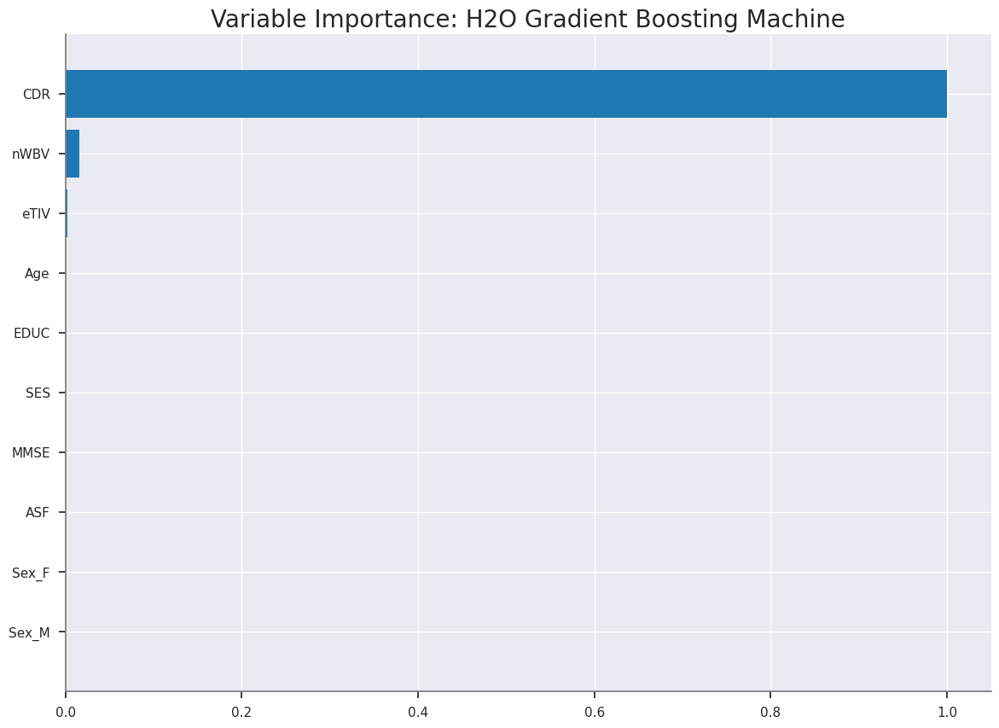

<Figure size 1600x800 with 0 Axes>

In [ ]:
# Importance of all the variables.
if best_model.algo in [
    "gbm",
    "drf",
    "deeplearning",
    "xgboost"]:
    best_model.varimp_plot()

The above graph is a variable Importance Graph on the H20's GBM Model

* Clinical Dementia Rating (CDR) is the Most Important Variable among all with importance of 1.0 (As if this Importance is scaled to 100%)
* Age  is 0.1 (It is important compared to CDR )

82
glm


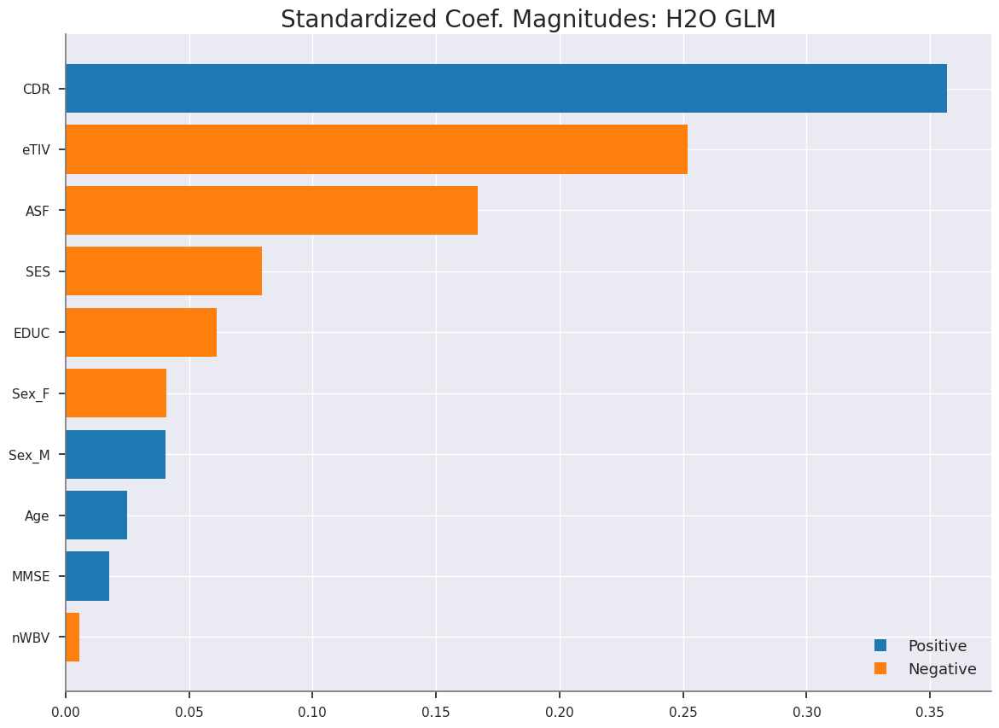

In [ ]:
if glm_index is not 0:
    print(glm_index)
    glm_model = h2o.get_model(aml.leaderboard[glm_index, "model_id"])
    print(glm_model.algo)
    glm_model.std_coef_plot()

In [ ]:
print(best_model.rmse(train=True))

0.2971241161784935


In [ ]:
def model_performance_stats(perf):
    d = {}
    try:
        d["mse"] = perf.mse()
    except:
        pass
    try:
        d["rmse"] = perf.rmse()
    except:
        pass
    try:
        d["null_degrees_of_freedom"] = perf.null_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_degrees_of_freedom"] = perf.residual_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_deviance"] = perf.residual_deviance()
    except:
        pass
    try:
        d["null_deviance"] = perf.null_deviance()
    except:
        pass
    try:
        d["aic"] = perf.aic()
    except:
        pass
    try:
        d["logloss"] = perf.logloss()
    except:
        pass
    try:
        d["auc"] = perf.auc()
    except:
        pass
    try:
        d["gini"] = perf.gini()
    except:
        pass
    return d


In [ ]:
mod_perf = best_model.model_performance(df_test)
stats_test = {}
stats_test = model_performance_stats(mod_perf)
stats_test

{'mse': 0.026081724534183153,
 'rmse': 0.16149837316265186,
 'null_degrees_of_freedom': None,
 'residual_degrees_of_freedom': None,
 'residual_deviance': None,
 'null_deviance': None}

In [ ]:
predictions = best_model.predict(df_test)

gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [ ]:
# Predictions on Test Dataset using the best model from the leaderboard.
y_pred = h2o.as_list(predictions)
print(y_pred)

     predict
0   0.939377
1   0.250602
2   0.218579
3   0.218579
4   0.250602
5   0.218579
6   0.918309
7   0.218579
8   0.986663
9   0.197511
10  0.182249
11  0.986663
12  0.250602
13  0.250602
14  0.182249
15  0.203317
16  0.918309
17  0.986663
18  0.250602
19  0.918309
20  0.986663
21  0.986663
22  0.250602
23  0.197511
24  0.203317
25  1.001924
26  0.182249
27  0.986663
28  0.182249
29  0.986663
30  1.001924
31  0.986663
32  1.001924
33  0.986663


In [ ]:
# Real Answers
y_test = h2o.as_list(df_test[y])
y_test

,Group
0,1
1,0
2,0
3,0
4,0
5,0
6,1
7,0
8,1
9,0


#SHAP Analysis on AutoML model

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
GBM_grid_1_AutoML_1_20230410_20736_model_90,0.140843,0.0198367,0.107125,0.126134,0.0198367,56,0.066067,GBM
StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_20736,0.141824,0.0201141,0.114594,0.128093,0.0201141,229,0.388567,StackedEnsemble
XGBoost_grid_1_AutoML_1_20230410_20736_model_63,0.14502,0.0210308,0.112707,0.130361,0.0210308,173,0.049508,XGBoost
GBM_grid_1_AutoML_1_20230410_20736_model_95,0.14632,0.0214094,0.103684,0.128192,0.0214094,43,0.179735,GBM
GBM_grid_1_AutoML_1_20230410_20736_model_51,0.147683,0.0218104,0.101609,0.130129,0.0218104,82,0.037853,GBM
GBM_grid_1_AutoML_1_20230410_20736_model_73,0.148772,0.0221332,0.104099,0.132634,0.0221332,47,0.048811,GBM
GBM_grid_1_AutoML_1_20230410_20736_model_26,0.1497,0.0224102,0.105507,0.130777,0.0224102,77,0.054953,GBM
GBM_grid_1_AutoML_1_20230410_20736_model_43,0.150463,0.022639,0.113296,0.134061,0.022639,82,0.713726,GBM
XGBoost_grid_1_AutoML_1_20230410_20736_model_49,0.150868,0.0227612,0.110008,0.134095,0.0227612,72,0.033103,XGBoost
GBM_4_AutoML_1_20230410_20736,0.151865,0.023063,0.107115,0.131659,0.023063,194,0.034656,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

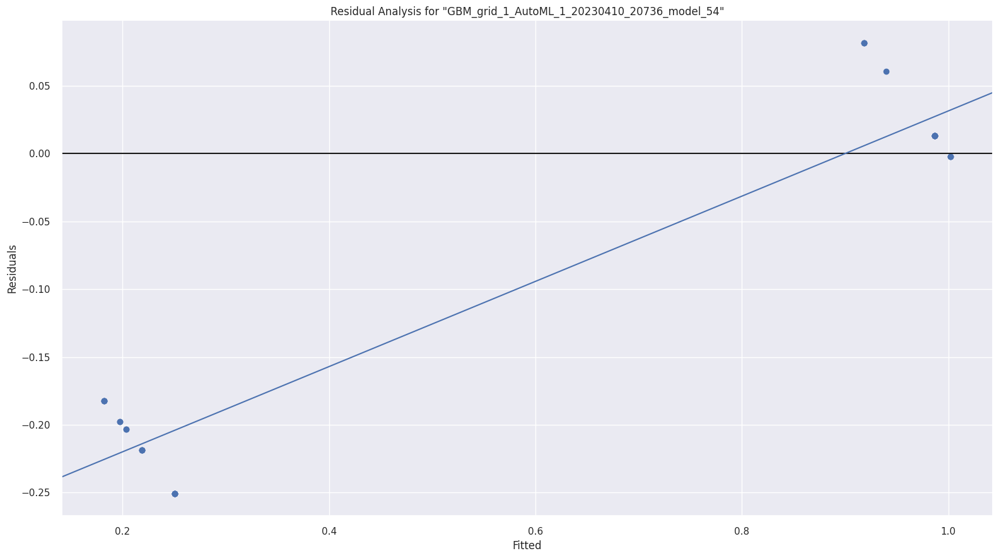

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

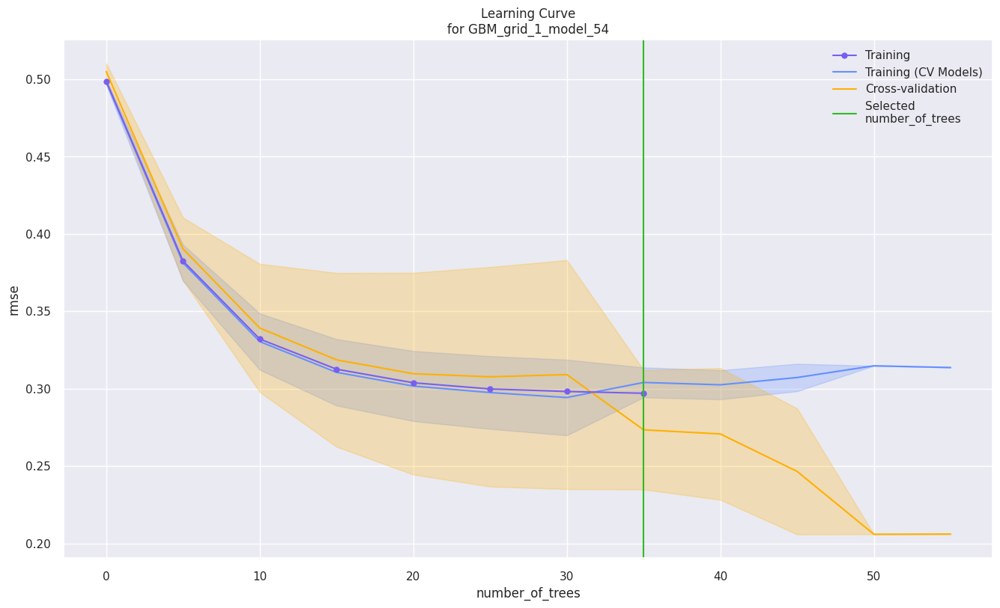

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

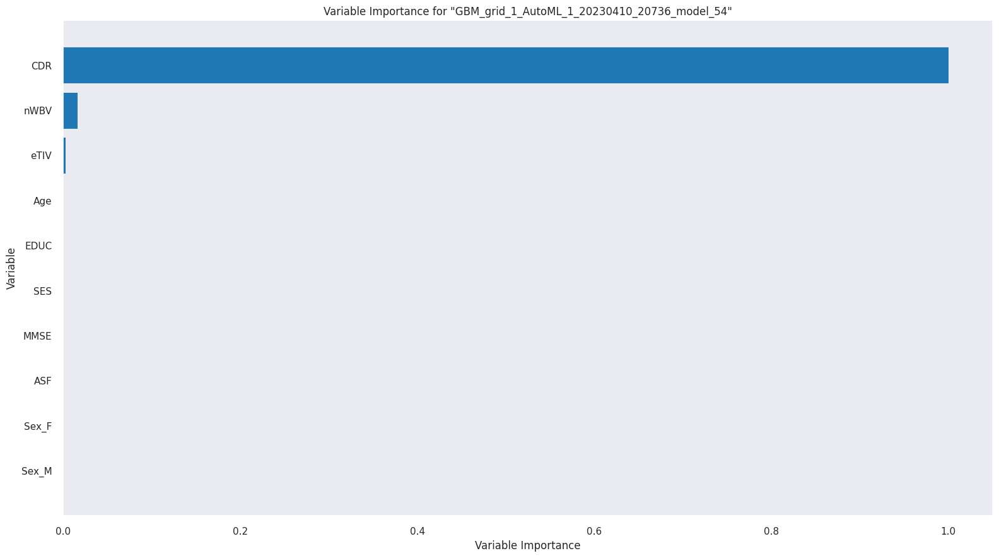

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

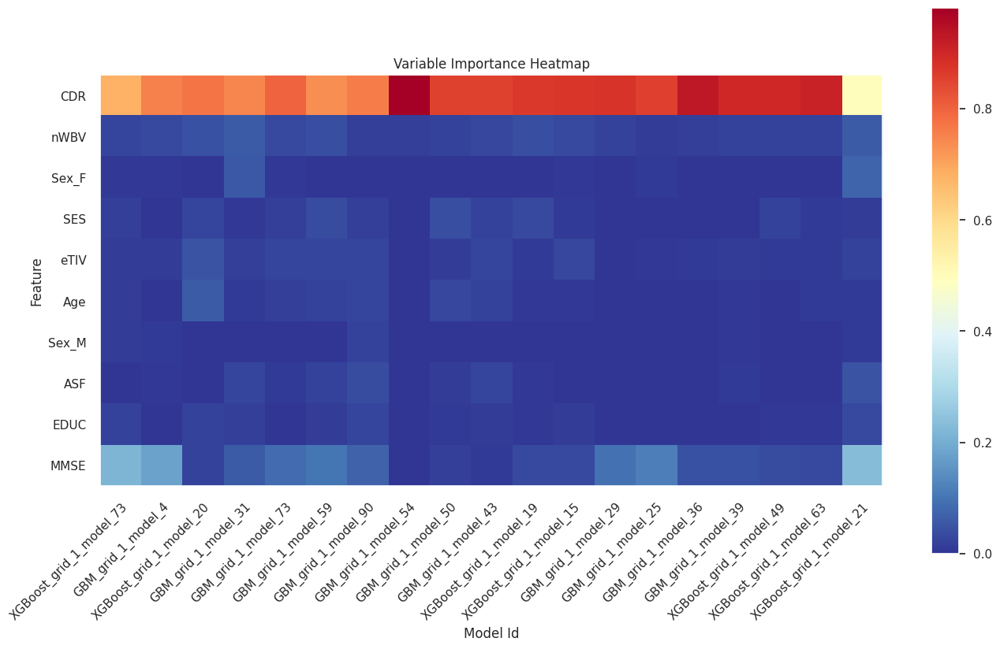

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

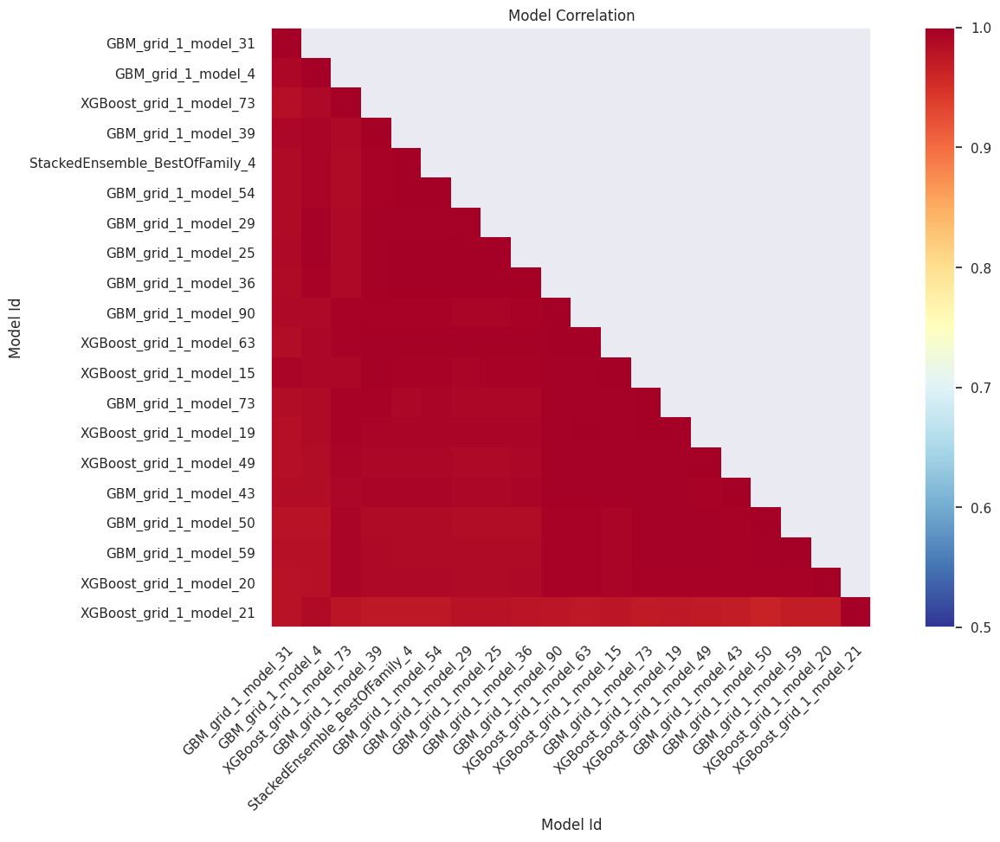

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

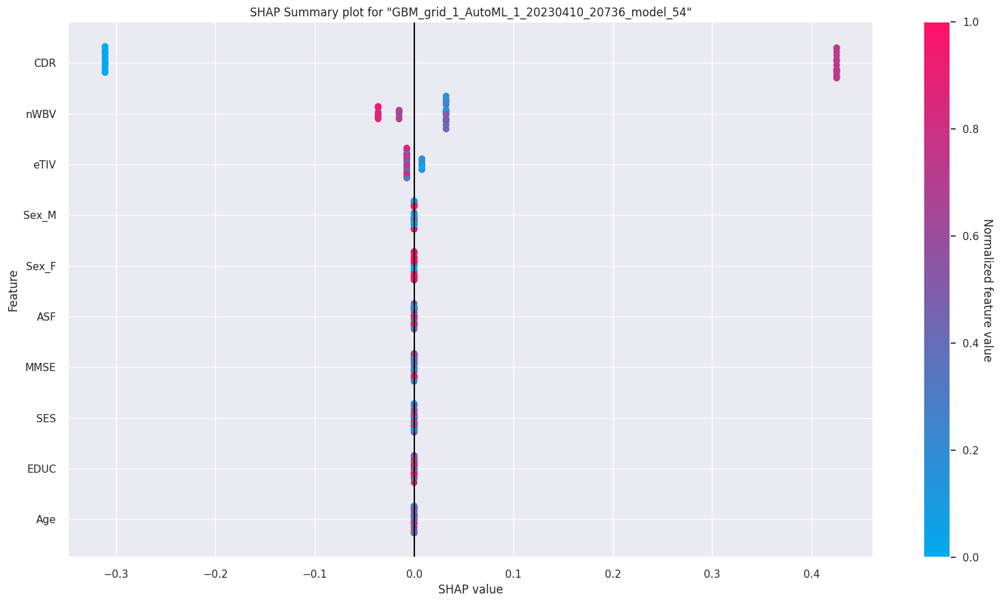

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

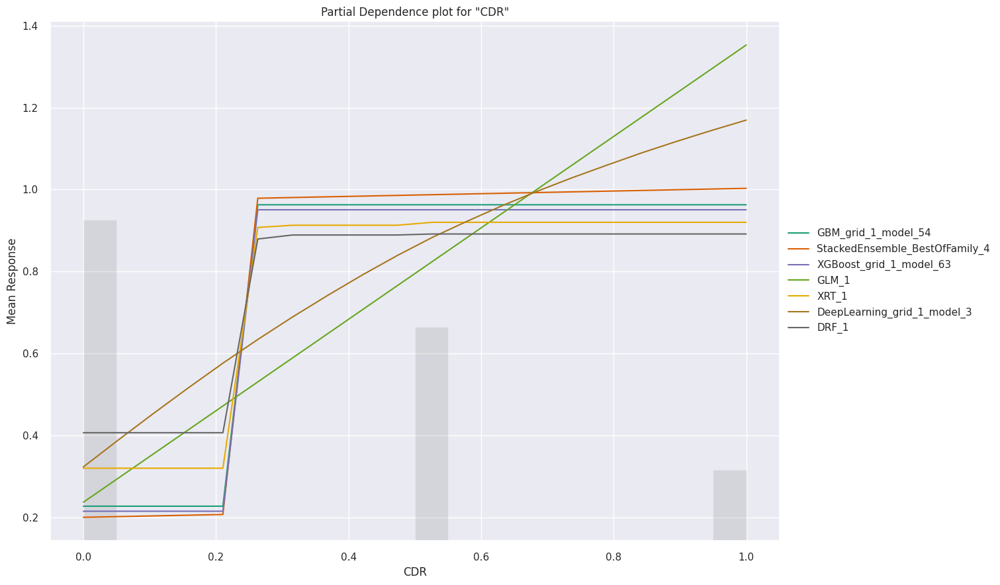

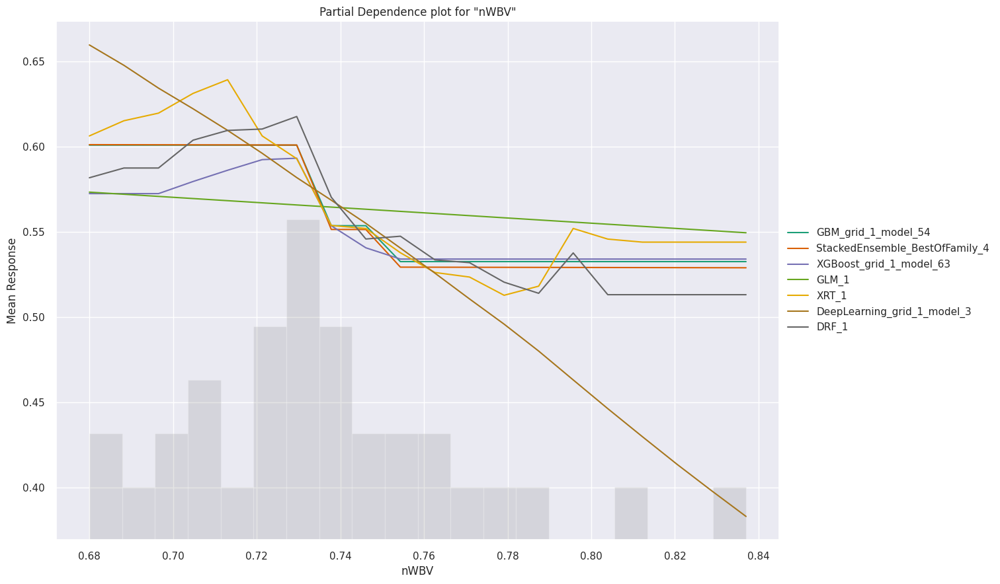

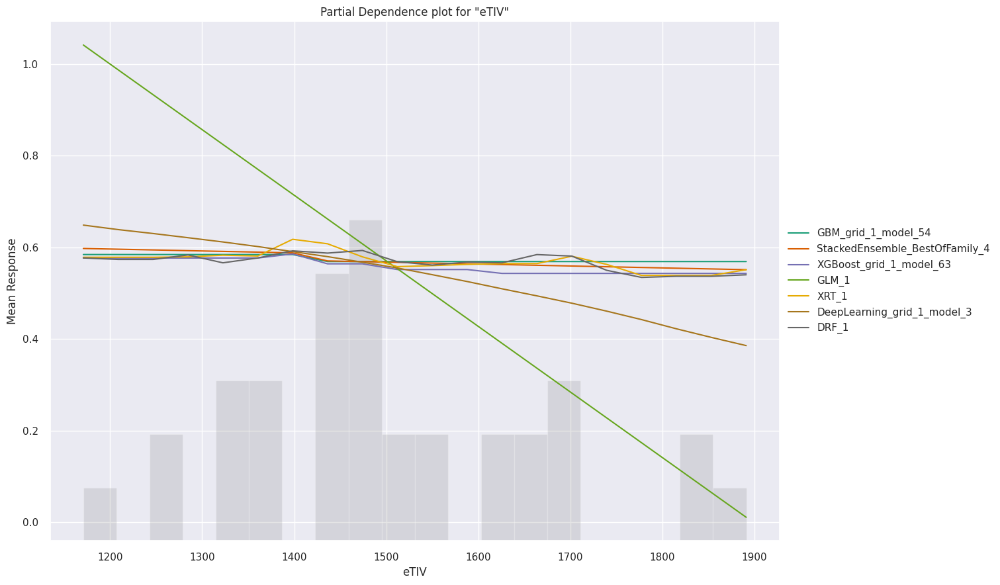

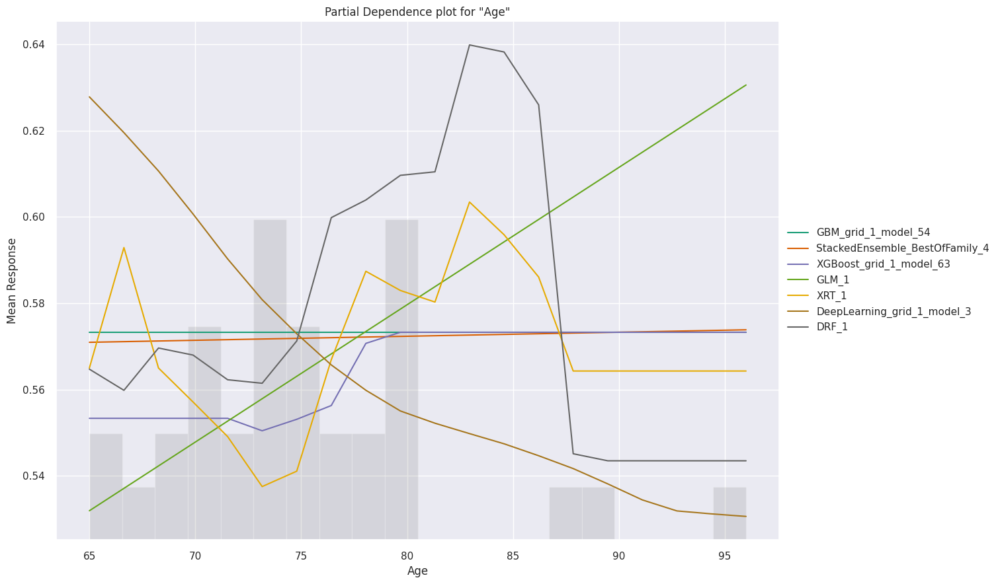

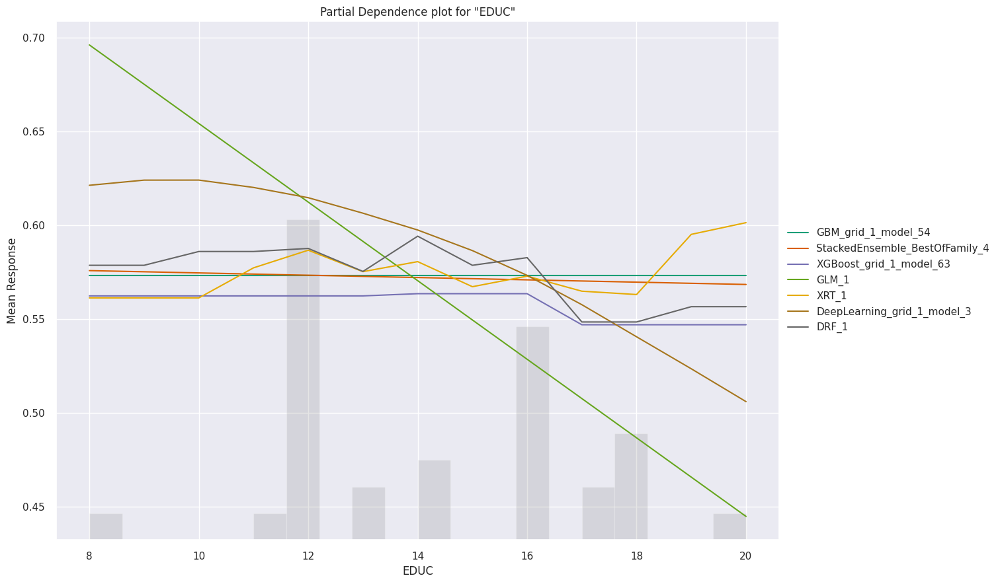

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

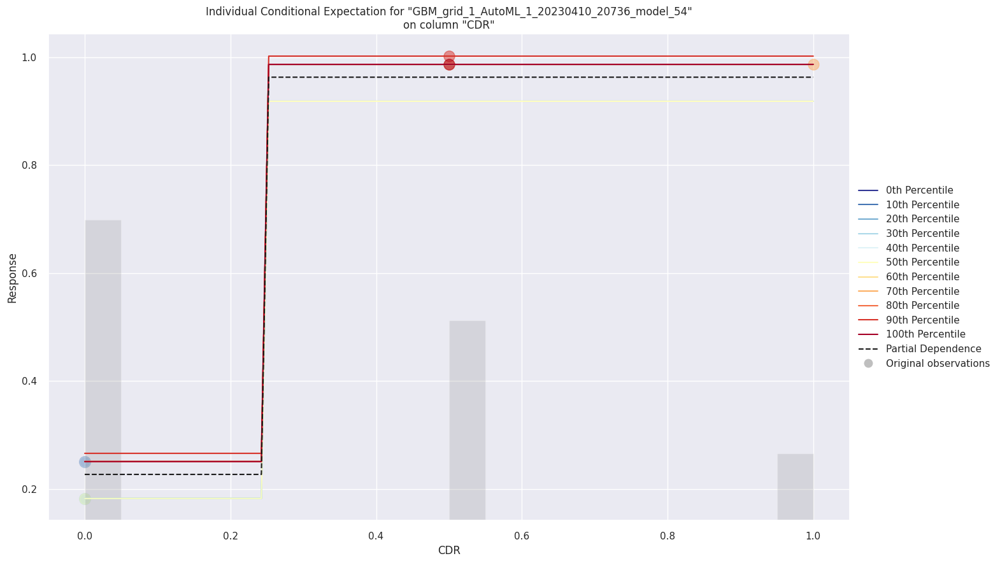

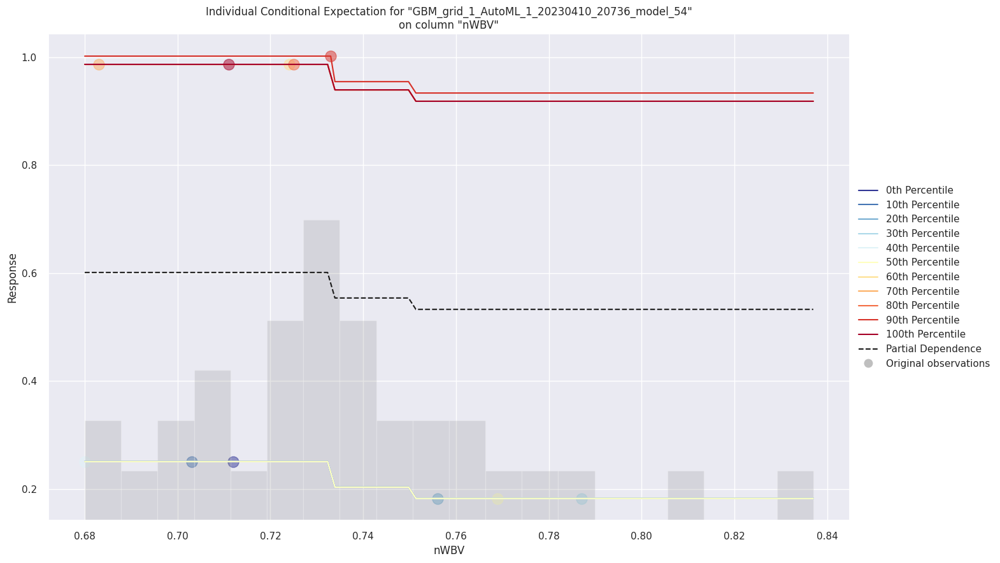

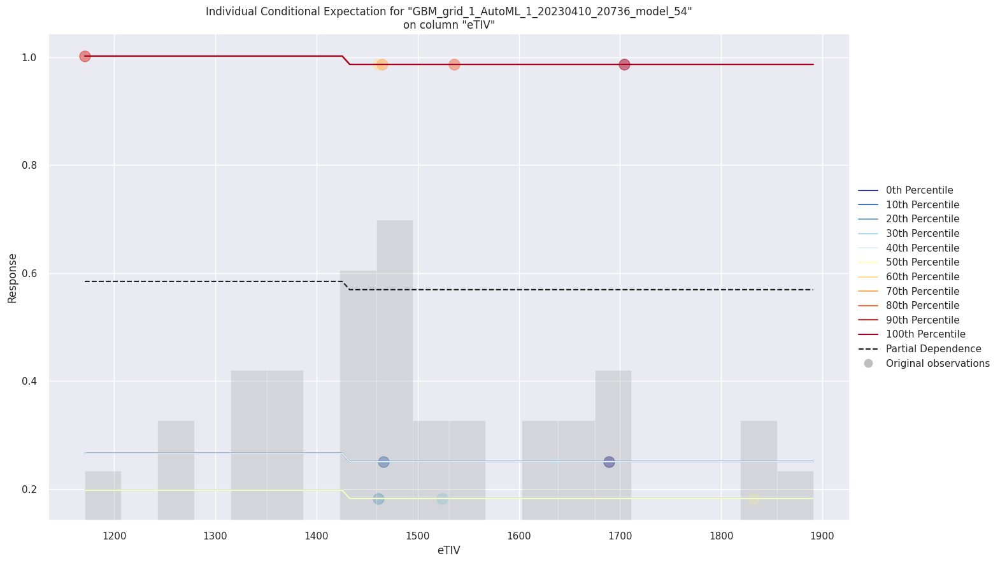

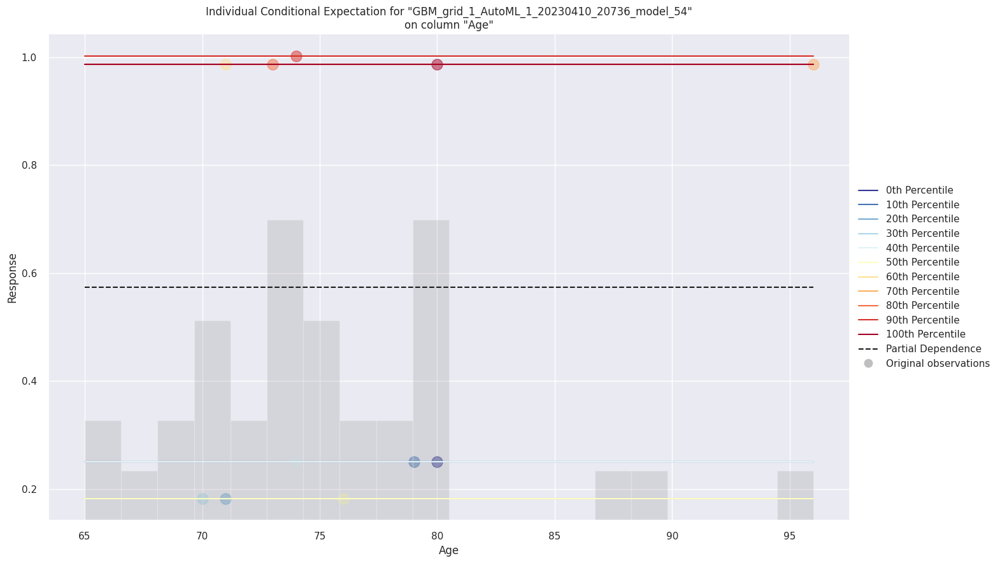

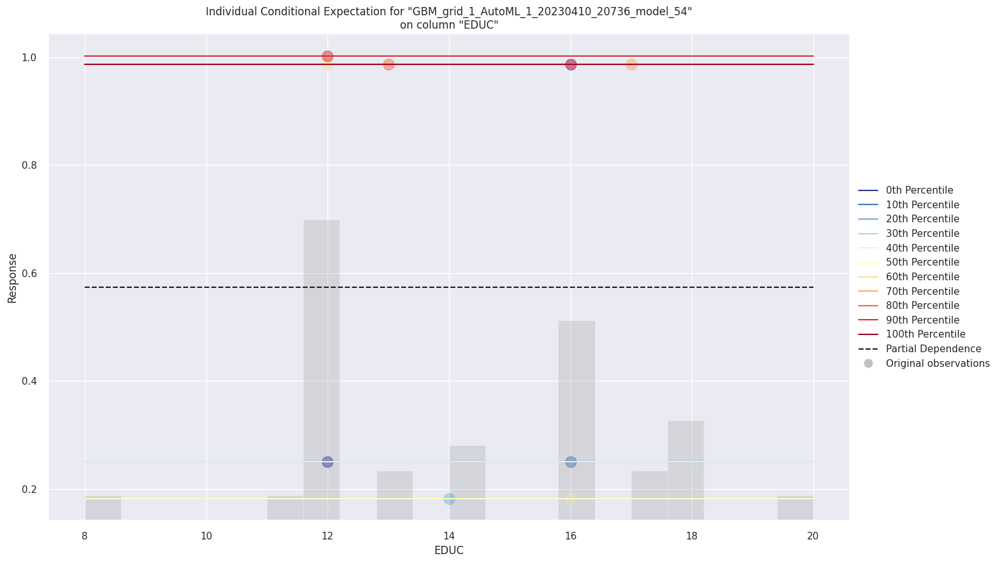

In [ ]:
exa = aml.explain(df_test)

##Residual Analysis
Here, we can see the striped lines of residuals, which is an artifact of having an integer value as a response value, instead of a real value. It can also be observed from the below graph that residuals are normally distributed. Residuals signify that residuals don't have heteroscedasticity.

##Variable Importance
In the variable importance plot we can observe that the plot replicates the results which we got from the Linear Model and Tree-Based Model above. The variable importance has been scaled between 0 to 1 for ease of understanding

##SHAP Summary
From the SHAP summary diagram, we can interpret a few conclusions -

1. All the features are listed as per their importance in making the prediction, that is CDR is more significant followed by MMSE, and so on. Hence, Gender is the least significant predictor in our model.
2. The position on the SHAP value axis indicates the impact the feature has on the prediction either positive or negative. That is, the more the data point is away from the 0.0 shap value - the more its impact is. As we can see CDR has the most impact on the prediction of AD. The color of the dot represents (Red - High, Blue - Low) the impact of the value on the result. i.e. - High value of CDR results in Dementia.

The advantage of SHAP analysis over normal feature importance is that we could visualize how the feature is affecting the target at different values. The standard methods tend to overestimate the importance of continuous or high-cardinality categorical variables.


#Regularization

Ridge and Lasso regression are some of the simple techniques to reduce model complexity and prevent over-fitting which may result from simple linear regression.

In this Section, we will be using the GLM model to check if regularization is helping us to improve the accuracy and reduce overfitting.

In [ ]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

dementia_glm = H2OGeneralizedLinearEstimator(
    family="binomial", lambda_=0.001, compute_p_values=True, nfolds=5, remove_collinear_columns=True
)  # Elastic Net Regularization
dementia_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="binomial", alpha=0, nfolds=5
)  # RIDGE Regularization
dementia_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="binomial", alpha=1, nfolds=5
)  # LASSO Regularization
dementia_glm_regularization_lamba_search = H2OGeneralizedLinearEstimator(
    lambda_search=True
)  # Lambda Search

In [ ]:
dementia_glm.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681092434529_26


GLM Model: summary
    family    link    regularization                              number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  ------  ------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    binomial  logit   Elastic Net (alpha = 0.5, lambda = 0.001 )  10                            9                              4                       py_11_sid_ae37

ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.07335822417402846
RMSE: 0.27084723401583494
LogLoss: 0.24299225945348957
AUC: 0.9545997610513739
AUCPR: 0.9713637173506233
Gini: 0.9091995221027478
Null degrees of freedom: 115
Residual degrees of freedom: 106
Null deviance: 160.25798356214355
Residual deviance: 56.374204193209586
AIC: 76.37420419320958

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.31884430111178036
       0    1    Error    Rate
-----  ---  ---  -------  ------------
0      48   6    0.1111   (6.0/54.0)
1      5    57   0.0806   (5.0/62.0)
Total  53   63   0.0948   (11.0/116.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.318844     0.912     62
max f2                       0.26407      0.924765  70
max f0point5                 0.593241     0.958647  50
max accuracy                 0.593241     0.905172  50
max precision                0.999998     1         0
max recall                   0.0365344    1         111
max specificity              0.999998     1         0
max absolute_mcc             0.593241     0.826665  50
max min_per_class_accuracy   0.338542     0.903226  60
max mean_per_class_accuracy  0.593241     0.91129   50
max tns                      0.999998     54        0
max fns                      0.999998     61        0
max fps                      0.0126455    54        115
max tps                      0.0365344    62        111
max tnr                      0.999998     1         0
max fnr                      0.999998     0.983871  0
max fpr                      0.0126455    1         115
max tpr                      0.0365344    1         111

Gains/Lift Table: Avg response rate: 53.45 %, avg score: 160.50 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score     cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  --------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0172414                   4.00912            1.87097   1.87097            1                4.12946   1                           4.12946             0.0322581       0.0322581                  87.0968   87.0968            0.0322581
2        0.0258621                   3.67113            1.87097   1.87097            1                3.69571   1                           3.98488             0.016129        0.0483871                  87.0968   87.0968            0.0483871
3        0.0344828                   3.60509            1.87097   1.87097            1                3.61378   1                           3.8921              0.016129        0.0645161                  87.0968   87.0968            0.0645161
4        0.0431034                   3.4811             1.87097   1.87097            1                3.59447   1                           3.83258             0.016129        0.0806452                  87.0968   87.0968            0.0806452
5        

# Ridge Regularization

In [ ]:
dementia_glm_regularization_ridge.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681092434529_44


GLM Model: summary
    family    link    regularization              number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  ------  --------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    binomial  logit   Ridge ( lambda = 0.03641 )  10                            10                             4                       py_11_sid_ae37

ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.09197583397955979
RMSE: 0.3032751786407186
LogLoss: 0.31660194117417123
AUC: 0.937873357228196
AUCPR: 0.962498638297281
Gini: 0.875746714456392
Null degrees of freedom: 115
Residual degrees of freedom: 105
Null deviance: 160.25798356214355
Residual deviance: 73.45165035240773
AIC: 95.45165035240773

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33933290742806216
       0    1    Error    Rate
-----  ---  ---  -------  ------------
0      48   6    0.1111   (6.0/54.0)
1      5    57   0.0806   (5.0/62.0)
Total  53   63   0.0948   (11.0/116.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.339333     0.912     62
max f2                       0.339333     0.916399  62
max f0point5                 0.762257     0.949612  48
max accuracy                 0.36726      0.905172  54
max precision                0.997691     1         0
max recall                   0.103142     1         115
max specificity              0.997691     1         0
max absolute_mcc             0.36726      0.816948  54
max min_per_class_accuracy   0.340699     0.888889  61
max mean_per_class_accuracy  0.36726      0.908901  54
max tns                      0.997691     54        0
max fns                      0.997691     61        0
max fps                      0.103931     54        114
max tps                      0.103142     62        115
max tnr                      0.997691     1         0
max fnr                      0.997691     0.983871  0
max fpr                      0.103931     1         114
max tpr                      0.103142     1         115

Gains/Lift Table: Avg response rate: 53.45 %, avg score: 53.45 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score     cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  --------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0172414                   0.997436           1.87097   1.87097            1                0.99758   1                           0.99758             0.0322581       0.0322581                  87.0968   87.0968            0.0322581
2        0.0258621                   0.997063           1.87097   1.87097            1                0.997256  1                           0.997472            0.016129        0.0483871                  87.0968   87.0968            0.0483871
3        0.0344828                   0.995027           1.87097   1.87097            1                0.996613  1                           0.997257            0.016129        0.0645161                  87.0968   87.0968            0.0645161
4        0.0431034                   0.992483           1.87097   1.87097            1                0.993088  1                           0.996423            0.016129        0.0806452                  87.0968   87.0968            0.0806452
5        0.0517241                   0.991792           1.87097

**The regularization appears to have similar rmse and mse values to the H2O model above.**



# Lasso Regularization

In [ ]:
dementia_glm_regularization_lasso.train(x=X, y=y, training_frame=df_train)


glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681092434529_62


GLM Model: summary
    family    link    regularization             number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  ------  -------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    binomial  logit   Lasso (lambda = 0.03641 )  10                            2                              6                       py_11_sid_ae37

ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.09271995496787801
RMSE: 0.30449951554621235
LogLoss: 0.31063929189534184
AUC: 0.9278673835125447
AUCPR: 0.9554562451285518
Gini: 0.8557347670250894
Null degrees of freedom: 115
Residual degrees of freedom: 113
Null deviance: 160.25798356214355
Residual deviance: 72.0683157197193
AIC: 78.0683157197193

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.9327256085111947
       0    1    Error    Rate
-----  ---  ---  -------  ------------
0      54   0    0        (0.0/54.0)
1      13   49   0.2097   (13.0/62.0)
Total  67   49   0.1121   (13.0/116.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.932726     0.882883  8
max f2                       0.234946     0.888889  9
max f0point5                 0.932726     0.949612  8
max accuracy                 0.932726     0.887931  8
max precision                0.998451     1         0
max recall                   0.23297      1         12
max specificity              0.998451     1         0
max absolute_mcc             0.932726     0.798108  8
max min_per_class_accuracy   0.234946     0.796296  9
max mean_per_class_accuracy  0.932726     0.895161  8
max tns                      0.998451     54        0
max fns                      0.998451     59        0
max fps                      0.232313     54        13
max tps                      0.23297      62        12
max tnr                      0.998451     1         0
max fnr                      0.998451     0.951613  0
max fpr                      0.232313     1         13
max tpr                      0.23297      1         12

Gains/Lift Table: Avg response rate: 53.45 %, avg score: 53.45 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score     cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  --------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0258621                   0.998451           1.87097   1.87097            1                0.998451  1                           0.998451            0.0483871       0.0483871                  87.0968   87.0968            0.0483871
2        0.0258621                   0.998449           0         1.87097            0                0         1                           0.998451            0               0.0483871                  -100      87.0968            0.0483871
3        0.0431034                   0.998445           1.87097   1.87097            1                0.998445  1                           0.998449            0.0322581       0.0806452                  87.0968   87.0968            0.0806452
4        0.0431034                   0.998442           0         1.87097            0                0         1                           0.998449            0               0.0806452                  -100      87.0968            0.0806452
5        0.0603448                   0.99844            1.87097   1.87097   

#Which Regularization Method Helps ?
* The Lasso regularization appears to have increased the MSE, RMSE, MAE, and RMSLE values compared to the non-regularized and Ridge regularized models, indicating worse performance. The R-squared value also decreased, indicating a worse fit to the data.

* So based on these metrics, it seems that Lasso did not help in this case and performed worse than Ridge. However, it's always a good practice to try multiple regularization techniques and compare their performance using different metrics, as the optimal regularization method can depend on the specific dataset and modeling task.

* Here, we can observe that after applying the ridge regularization, there is a slight improvement in the evaluation metrics on the cross validation data, hence it can be concluded that Ridge regularization helps us avoid the overfitting of model and improvements of metrics on the validation dataset.

# Lambda Search

In [ ]:
lambda_search = dementia_glm_regularization_lamba_search.train(
    x=X, y=y, training_frame=df_train
)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


In [ ]:
lambda_search

Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681092434529_80


GLM Model: summary
    family    link      regularization                                 lambda_search                                                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ---------------------------------------------  ----------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 0.007282 )  nlambda = 100, lambda.max = 0.7282, lambda.min = 0.007282, lambda.1se = -1.0  10                            9                              100                     py_11_sid_ae37

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.10546268420638936
RMSE: 0.3247501873846871
MAE: 0.2694420360596997
RMSLE: 0.2216936156888442
Mean Residual Deviance: 0.10546268420638936
R^2: 0.5761332500952283
Null degrees of freedom: 115
Residual degrees of freedom: 106
Null deviance: 28.86206896551724
Residual deviance: 12.233671367941167
AIC: 90.26356093416675

Scoring History: 
     timestamp            duration    iteration    lambda    predictors    deviance_train       alpha    iterations    training_rmse       training_deviance    training_mae        training_r2
---  -------------------  ----------  -----------  --------  ------------  -------------------  -------  ------------  ------------------  -------------------  ------------------  ------------------
     2023-04-10 02:11:28  0.000 sec   1            .73E0     1             0.2488109393579073   0.5
     2023-04-10 02:11:28  0.001 sec   2            .7E0      2             0.2399625135548683   0.5
     2023-04-10 02:11:28  0.003 sec   3            .66E0     2             0.2316026943349765   0.5
     2023-04-10 02:11:28  0.004 sec   4            .63E0     2             0.22371423795289042  0.5
     2023-04-10 02:11:28  0.005 sec   5            .6E0      2             0.21627953342127862  0.5
     2023-04-10 02:11:28  0.007 sec   6            .58E0     2             0.2092807211737158   0.5
     2023-04-10 02:11:28  0.012 sec   7            .55E0     2             0.202699804124485    0.5
     2023-04-10 02:11:28  0.012 sec   8            .53E0     2             0.1965187506637297   0.5
     2023-04-10 02:11:28  0.013 sec   9            .5E0      2             0.19071958927613397  0.5
     2023-04-10 02:11:28  0.013 sec   10           .48E0     2             0.1852844946103974   0.5
---  ---                  ---         ---          ---       ---           ---                  ---      ---           ---                 ---                  ---                 ---
     2023-04-10 02:11:28  0.055 sec   91           .11E-1    9             0.10579926539783176  0.5
     2023-04-10 02:11:28  0.055 sec   92           .11E-1    9             0.10575990320853763  0.5
     2023-04-10 02:11:28  0.056 sec   93           .1E-1     9             0.10572397474003375  0.5
     2023-04-10 02:11:28  0.057 sec   94           .96E-2    10            0.10567828587202645  0.5
     2023-04-10 02:11:28  0.057 sec   95           .92E-2    10            0.10563376165108225  0.5
     2023-04-10 02:11:28  0.057 sec   96           .88E-2    10            0.10559303270805001  0.5
     2023-04-10 02:11:28  0.058 sec   97           .84E-2    10            0.10555579419489927  0.5
     2023-04-10 02:11:28  0.058 sec   98           .8E-2     10            0.10552193728328255  0.5
     2023-04-10 02:11:28  0.058 sec   99           .76E-2    10            0.10549092323879178  0.5
     2023-04-10 02:11:28  0.058 sec   100          .73E-2    10            0.10546268420638928  0.5      100           0.3247501873846871  0.10546268420638936  0.2694420360596997  0.5761332500952283
[100 rows x 13 co

Above parameters are from a lambda search, which means that the model was trained on a range of different values of the regularization parameter lambda to find the value that minimized the selected loss function. Based on the reported metrics, it seems that the optimal value of lambda resulted in a slightly improved model compared to the non-regularized model. The MSE, RMSE, and MAE all decreased slightly, indicating that the model is making slightly more accurate predictions on the training data. The R^2 value, which measures how well the model fits the data, decreased slightly, which may indicate that the model is not overfitting the training data as much. Overall, the lambda search seems to have resulted in a slightly improved model.


*   MSE improved from 0.4234393816333662 to 0.42185125944877285, or by 0.375%

*   RMSE improved from 0.6507222000465069 to 0.6493051832461667, or by 0.218%
*   MAE improved from 0.5049750807378458 to 0.5035142349852977, or by 0.290%


*   RMSLE improved from 0.09927527847388463 to 0.09893003268921823, or by 0.348%
*   R-squared improved from 0.358097238638058 to 0.3603008092769123, or by 0.616%


Here we can observe that regularization helps a bit in reducing the overfitting of our GLM model.

In [ ]:
coeff_table = dementia_glm._model_json["output"]["coefficients_table"]

In [ ]:
coeff_table.as_data_frame()  # Z-Value and P-Value showing the significance of each attributes.

,names,coefficients,std_error,z_value,p_value,standardized_coefficients
0,Intercept,68.555434,49.560565,1.383266,0.166583,1.722616
1,Age,0.056094,0.060580,0.925949,0.354472,0.439972
2,EDUC,-0.195902,0.163764,-1.196242,0.231602,-0.573492
3,SES,-0.927599,0.459214,-2.019970,0.043387,-1.005028
4,MMSE,0.118025,0.301705,0.391194,0.695654,0.340515
5,CDR,14.116735,4.399760,3.208524,0.001334,4.512365
6,eTIV,-0.026803,0.016997,-1.576901,0.114818,-4.710945
7,nWBV,3.899389,14.550069,0.267998,0.788701,0.145700
8,ASF,-29.262855,20.502099,-1.427310,0.153491,-4.086304
9,Sex_F,-1.289345,0.983420,-1.311082,0.189830,-0.637773


# Hyperparameter Tuning

In [ ]:
import statsmodels.formula.api as smf  # OLS model Library

In [ ]:
import h2o
hp_df = h2o.as_list(df)

In [ ]:
results = smf.ols(
    "Group ~ Age + EDUC + SES + MMSE + CDR + eTIV + nWBV + ASF ",
    data=hp_df,
).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Group   R-squared:                       0.606
Model:                            OLS   Adj. R-squared:                  0.583
Method:                 Least Squares   F-statistic:                     27.06
Date:                Mon, 10 Apr 2023   Prob (F-statistic):           4.78e-25
Time:                        02:11:28   Log-Likelihood:                -38.981
No. Observations:                 150   AIC:                             95.96
Df Residuals:                     141   BIC:                             123.1
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.8012      3.119      1.219      0.225      -2.364       9.967
Age            0.0004      0.004      0.097      0.923      -0.008       0.009
EDUC          -0.0188      0.014     -1.353      0.178      -0.046       0.009
SES           -0.0562      0.036     -1.580      0.116      -0.126       0.014
MMSE           0.0003      0.013      0.027      0.979      -0.025       0.025
CDR            1.1597      0.117      9.902      0.000       0.928       1.391
eTIV          -0.0010      0.001     -1.043      0.299      -0.003       0.001
nWBV          -0.4748      0.999     -0.475      0.635      -2.449       1.499
ASF           -1.0884      1.272     -0.856      0.393      -3.602       1.425
==============================================================================
Omnibus:                       19.816   Durbin-Watson:                   1.814
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               23.537
Skew:                           0.954   Prob(JB):                     7.75e-06
Kurtosis:                       3.357   Cond. No.                     1.89e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.89e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
train, validate, test = np.split(
    hp_df.sample(frac=1, random_state=42), [int(0.6 * len(df)), int(0.8 * len(df))]
)

train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
gbm_parameters = {
    "learn_rate": [i * 0.01 for i in range(1, 11)],
    "max_depth": list(range(2, 11)),
    "sample_rate": [i * 0.1 for i in range(5, 11)],
    "col_sample_rate": [i * 0.1 for i in range(1, 11)],
}

In [ ]:
search_criteria = {"strategy": "RandomDiscrete", "max_models": 36, "seed": 1}

In [ ]:
gbm_grid2 = H2OGridSearch(
    model=H2OGradientBoostingEstimator,
    grid_id="gbm_grid2",
    hyper_params=gbm_parameters,
    search_criteria=search_criteria,
)

In [ ]:
gbm_grid2.train(
    x=X, y=y, training_frame=train, validation_frame=validate, ntrees=100, seed=1
)

gbm Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%


,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.8,0.04,2.0,0.9,gbm_grid2_model_4,0.0712621
,0.8,0.03,5.0,0.5,gbm_grid2_model_12,0.0712771
,0.9,0.03,10.0,0.5,gbm_grid2_model_21,0.0725359
,0.8,0.03,9.0,0.9,gbm_grid2_model_8,0.0730711
,0.9,0.07,4.0,0.9,gbm_grid2_model_17,0.0732242
,0.5,0.03,2.0,0.6000000,gbm_grid2_model_26,0.0734928
,0.6000000,0.09,3.0,0.9,gbm_grid2_model_18,0.0737592
,0.5,0.1,4.0,0.8,gbm_grid2_model_33,0.0739429
,0.3000000,0.03,8.0,1.0,gbm_grid2_model_5,0.0741775
,0.5,0.05,2.0,0.8,gbm_grid2_model_27,0.0744261


In [ ]:
gbm_gridperf2 = gbm_grid2.get_grid(sort_by="residual_deviance", decreasing=False)

In [ ]:
gbm_gridperf2

,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.8,0.04,2.0,0.9,gbm_grid2_model_4,0.0712621
,0.8,0.03,5.0,0.5,gbm_grid2_model_12,0.0712771
,0.9,0.03,10.0,0.5,gbm_grid2_model_21,0.0725359
,0.8,0.03,9.0,0.9,gbm_grid2_model_8,0.0730711
,0.9,0.07,4.0,0.9,gbm_grid2_model_17,0.0732242
,0.5,0.03,2.0,0.6000000,gbm_grid2_model_26,0.0734928
,0.6000000,0.09,3.0,0.9,gbm_grid2_model_18,0.0737592
,0.5,0.1,4.0,0.8,gbm_grid2_model_33,0.0739429
,0.3000000,0.03,8.0,1.0,gbm_grid2_model_5,0.0741775
,0.5,0.05,2.0,0.8,gbm_grid2_model_27,0.0744261


In [ ]:
list_hyperparameters = []
for i in range(36):
    hyperparameters = gbm_gridperf2.get_hyperparams_dict(i)
    list_hyperparameters.append(hyperparameters)

Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperp

In [ ]:
models = gbm_gridperf2.models

In [ ]:
list_residual_deviance = []
for i in range(36):
    model = models[i]
    performance_metrics = model.model_performance(validate)
    residual_deviance = performance_metrics.mean_residual_deviance()
    list_residual_deviance.append(residual_deviance)

In [ ]:
for i in range(36):
    list_hyperparameters[i]["Residual_Deviance"] = list_residual_deviance[i]

In [ ]:
hyperparameters_dataframe = pd.DataFrame(list_hyperparameters)

In [ ]:
print(hyperparameters_dataframe)

    col_sample_rate  learn_rate  max_depth  sample_rate  Residual_Deviance
0               0.8        0.04          2          0.9           0.071262
1               0.8        0.03          5          0.5           0.071277
2               0.9        0.03         10          0.5           0.072536
3               0.8        0.03          9          0.9           0.073071
4               0.9        0.07          4          0.9           0.073224
5               0.5        0.03          2          0.6           0.073493
6               0.6        0.09          3          0.9           0.073759
7               0.5        0.10          4          0.8           0.073943
8               0.3        0.03          8          1.0           0.074177
9               0.5        0.05          2          0.8           0.074426
10              0.9        0.04          4          0.9           0.074819
11              0.5        0.05          7          0.9           0.075902
12              0.9      

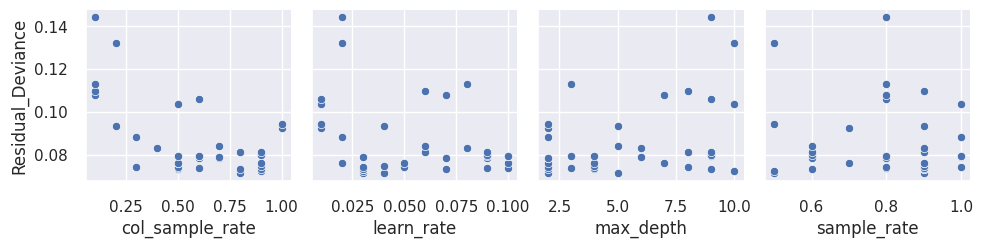

In [ ]:
sns.pairplot(
    hyperparameters_dataframe,
    y_vars=["Residual_Deviance"],
    x_vars=["col_sample_rate", "learn_rate", "max_depth", "sample_rate"],
)

1. This is a summary of hyperparameter tuning for an XGBoost model, which involved a grid search over a range of values for four hyperparameters: col_sample_rate, learn_rate, max_depth, and sample_rate. The search resulted in a total of 36 combinations of hyperparameters, and for each combination, the Residual Deviance was calculated as an evaluation metric.
2. Based on the results, the hyperparameter combination with the lowest Residual Deviance was a model with col_sample_rate of 0.3, learn_rate of 0.03, max_depth of 8, and sample_rate of 1.0, with a Residual Deviance of 0.354805. The next best models had Residual Deviances in the range of 0.36-0.39, while the worst-performing models had Residual Deviances above 0.43.
3. Overall, the results suggest that the combination of col_sample_rate, learn_rate, max_depth, and sample_rate can have a significant impact on the performance of an XGBoost model, and that hyperparameter tuning can lead to significant improvements in model performance.

# Model Interpretability

In [ ]:
!pip install shap
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import lime
from lime import lime_tabular
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
import shap
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.inspection import PartialDependenceDisplay


sns.set(rc={"figure.figsize": (16, 8)})

In [ ]:
df01['Group'] = df01['Group'].replace(['Converted'], ['Demented']) # Target variable
df01['Group'] = df01['Group'].replace(['Demented', 'Nondemented'], [1,0]) # Target variable
df01 = df01.drop(['Subject ID','MRI ID', 'Visit', 'Hand'], axis=1) # Drop unnecessary columns

In [ ]:
# Perform one-hot encoding on the 'sex' column
sex_encoded = pd.get_dummies(df01['M/F'], prefix='Sex')
# Concatenate the encoded column with the original dataframe
df01 = pd.concat([df01, sex_encoded], axis=1)
# Dropping the original 'Sex' column
df01.drop(['M/F'], axis=1, inplace=True)
df01["Sex_F"]=df01["Sex_F"].astype(int)
df01["Sex_M"]=df01["Sex_M"].astype(int)
df01

,Group,MR Delay,Age,EDUC,SES,MMSE,CDR,eTIV,nWBV,ASF,Sex_F,Sex_M
0,0,0,87,14,2.0,27.0,0.0,1987,0.696,0.883,0,1
1,0,457,88,14,2.0,30.0,0.0,2004,0.681,0.876,0,1
2,1,0,75,12,3.0,23.0,0.5,1678,0.736,1.046,0,1
3,1,560,76,12,3.0,28.0,0.5,1738,0.713,1.010,0,1
4,1,1895,80,12,3.0,22.0,0.5,1698,0.701,1.034,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
368,1,842,82,16,1.0,28.0,0.5,1693,0.694,1.037,0,1
369,1,2297,86,16,1.0,26.0,0.5,1688,0.675,1.040,0,1
370,0,0,61,13,2.0,30.0,0.0,1319,0.801,1.331,1,0
371,0,763,63,13,2.0,30.0,0.0,1327,0.796,1.323,1,0


In [ ]:
X=df01.drop(['Group'],axis=1)
y=df01['Group']

In [ ]:
X_train,X_test,y_train,y_test=tts(X,y,test_size=0.2,random_state=42)

# Implementing Linear Regression

In [ ]:
#Computing Linear Regression model for Melbourne dataset
def linear_reg(X_train,y_train,X_test,y_test):
    linear_reg = LinearRegression()
    linear_reg_model = linear_reg.fit(X_train,y_train)
    print('Train set')
    pred=linear_reg_model.predict(X_train)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(y_train,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(y_train,pred)))
    print('Test set')
    pred=linear_reg_model.predict(X_test)
    model_lr=linear_reg_model.predict(X_test)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(y_test,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(y_test,pred)))

In [ ]:
from sklearn import linear_model

model = linear_model.LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [ ]:
cols1= ['CDR','eTIV','Age','EDUC','SES','MMSE','CDR','nWBV','ASF','Sex_F','Sex_M','MR Delay']

In [ ]:
#Computing R2 for testing and training data
linear_reg(X_train[cols1],y_train,X_test[cols1],y_test)

Train set
Linear Regression Mean Squared error :0.08289615575754308
Linear Regression r2_score :0.6672011656467968
Test set
Linear Regression Mean Squared error :0.12177705068841549
Linear Regression r2_score :0.5021832048529526


# SHAP Analysis on Linear Regression model

SHAP values for each feature represent the change in the expected model prediction when conditioning on that feature. For each feature, SHAP value explains the contribution to explain the difference between the average model prediction and the actual prediction of the instance.The essence of Shapley value is to measure the contributions to the final outcome from each player separately among the coalition, while preserving the sum of contributions being equal to the final outcome.SHAP values in model explanation can measure the input features contribution to individual predictions.

In [ ]:
shap.initjs()

In [ ]:
# Giving input as 1% of whole dataset as SHAP cant handle large dataset
X = X_train.sample(frac=0.01,random_state=200)
#LinearExplainer is used as linear regression model is used
explainer = shap.LinearExplainer(model, X, feature_perturbation="interventional")
shap_values = explainer.shap_values(X) #Saving SHAP values

In [ ]:
#Initialize java script
shap.initjs()

 #Explain one row in the data with the
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

The output of the model is 0.61 The features which had a significant positive impact on determining if the person has dementia or not were EDUC and eTIV respectively The features which had a significant negative impact on determining if the person has dementia or not were CDR, SES with 0.5 and 4 respectively

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X)

In [ ]:
#Initializing explainer from shap, lm is our trained model
explainer_shap=shap.LinearExplainer(model=model, masker=X_train)

#Computing shap values for train dataset
shap_values = explainer_shap.shap_values(X_train)

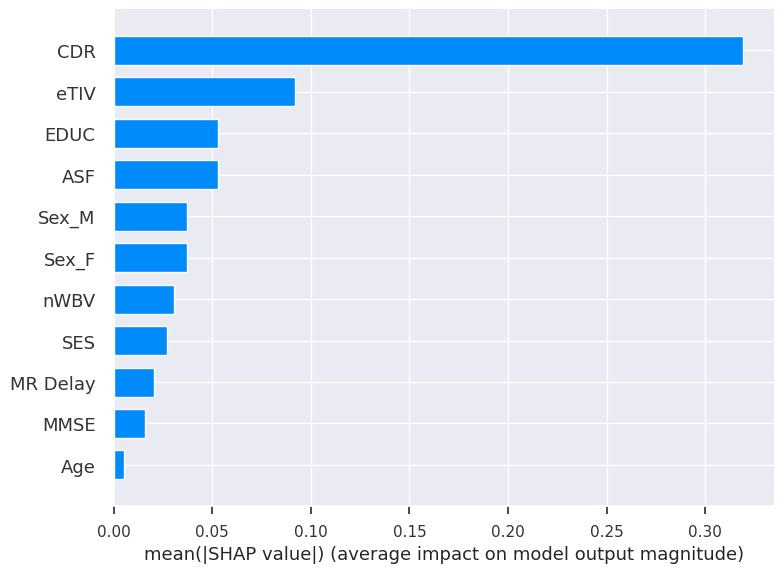

In [ ]:
shap.summary_plot(shap_values, X_train, plot_type="bar")

For the linear model, MMSE is the second most important feature and for our tree-based model MMSE is the second most important feature when we consider the average of SHAP values to calculate feature importance.

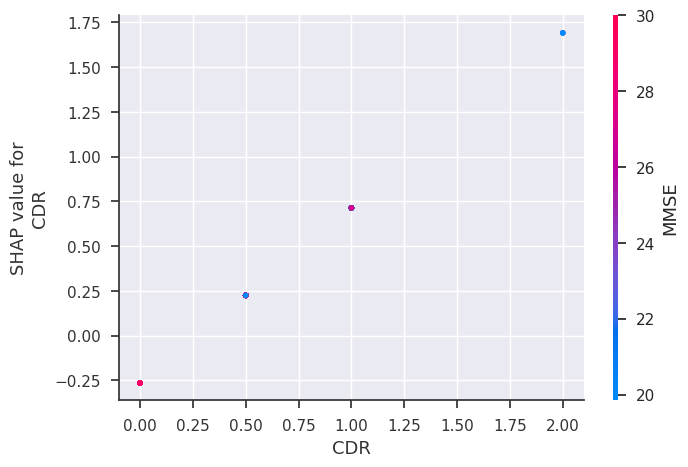

In [ ]:
shap.dependence_plot("CDR", shap_values, X_train)

In [ ]:
from sklearn.linear_model import LinearRegression
import shap

# train Linear model
#Seperating the dependent and independent variable from the main dataset
X=df01.drop(['Group'],axis=1)
y=df01['Group']
regressor = LinearRegression()
linear_reg = regressor.fit(X, y)

# compute SHAP values
explainer = shap.Explainer(linear_reg, X)
shap_values = explainer(X)

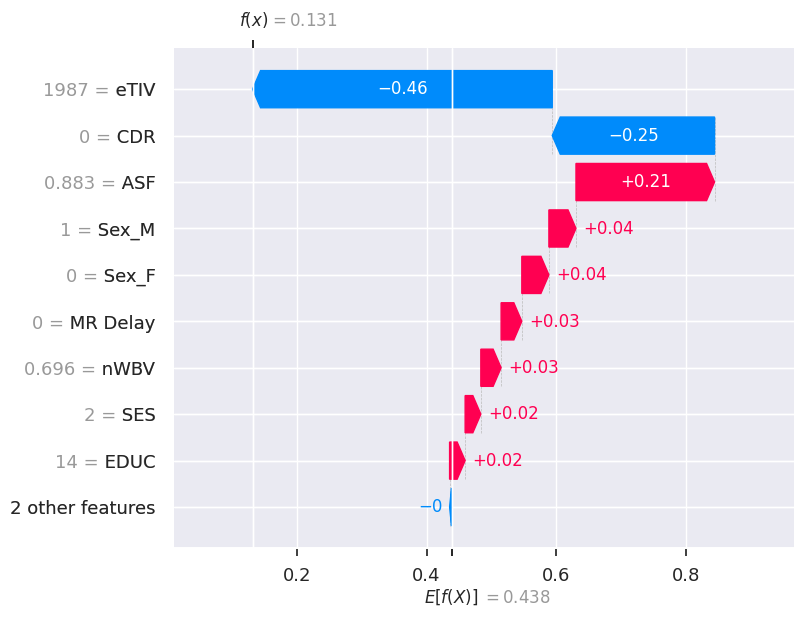

In [ ]:
shap.plots.waterfall(shap_values[0])

The above graph shows that eTIV has the biggest and most negative impact in determing if the person has dementia or not by 0.46 for this specific sample. Preceding by CDR which also has a negative impact by 0.25 for this sample, and so on.

# Implementing Random Forest

In [ ]:
def ramdomforest(X_train,y_train,X_test,y_test):
    rf = RandomForestRegressor()
    rf_model = rf.fit(X_train,y_train)
    print('Train set')
    pred=rf_model.predict(X_train)
    print('ramdomforest Mean Squared error :{}'.format(mean_squared_error(y_train,pred)))
    print('ramdomforest r2_score :{}'.format(r2_score(y_train,pred)))
    print('Test set')
    pred=rf_model.predict(X_test)
    print('ramdomforest Mean Squared error :{}'.format(mean_squared_error(y_test,pred)))
    print('ramdomforest r2_score :{}'.format(r2_score(y_test,pred)))

random_forest = RandomForestRegressor(n_estimators=100)
random_forest.fit(X_train, y_train)

RandomForestRegressor()

In [ ]:
from sklearn.ensemble import RandomForestRegressor

model_rf1 = RandomForestRegressor(n_estimators=10)
# Train
model_rf1.fit(X_train, y_train)
# Extract single tree
estimator = model_rf1.estimators_[5]

In [ ]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot',
                feature_names = list(X_train.columns),
                class_names = list(y_train.unique()),
                rounded = True, proportion = False,
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in colab notebook
from IPython.display import Image
Image(filename = 'tree.png')

Random Forest Regressor works on the concept of the wisdom of the crowd. The above decision tree is one of the many trees involved in predicting the target variable. Each decision tree regression predicts a number as an output for a given input. Random forest regression takes the average of those predictions as its final output.

As usual, the tree has conditions on each internal node and a value associated with each leaf (i.e. the value to be predicted). But additionally, we’ve plotted out the value at each internal node i.e. the mean of the response variables in that region.

In [ ]:
# Get numerical feature importances
tree_importances = list(model_rf1.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(X_train.columns, tree_importances)
]

In [ ]:
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: MR Delay             Importance: 0.02
Variable: Age                  Importance: 0.02
Variable: EDUC                 Importance: 0.02
Variable: SES                  Importance: 0.01
Variable: MMSE                 Importance: 0.02
Variable: CDR                  Importance: 0.85
Variable: eTIV                 Importance: 0.01
Variable: nWBV                 Importance: 0.04
Variable: ASF                  Importance: 0.01
Variable: Sex_F                Importance: 0.01
Variable: Sex_M                Importance: 0.0


The variable importance we get from the tree-based regressor re-inforces our interpretation from the linear model.

In [ ]:
ramdomforest(X_train[cols1],y_train,X_test[cols1],y_test)

Train set
ramdomforest Mean Squared error :0.0061872483221476525
ramdomforest r2_score :0.9751603797468354
Test set
ramdomforest Mean Squared error :0.09446666666666666
ramdomforest r2_score :0.613826308139535


# SHAP Analysis on Random Forest Model

In [ ]:
# Giving input as 1% of whole dataset as SHAP cant handle large dataset
X = X_train.head(10)
 # Using Tree explainer as this is tree based classifier model
explainer = shap.TreeExplainer(random_forest)
#Saving shap values
shap_values = explainer.shap_values(X)

In [ ]:
shap.initjs() #Initialize java script
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:]) #Explain one row in the data with the model

The output of the model is 0.03 The features which have a significant positive impact on determining if the person has dementia or not is MR Delay respectively. The features which had a significant negative impact on determining if the person has dementia or not were CDR, nWBV with 0 and 0.739 respectively

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X)

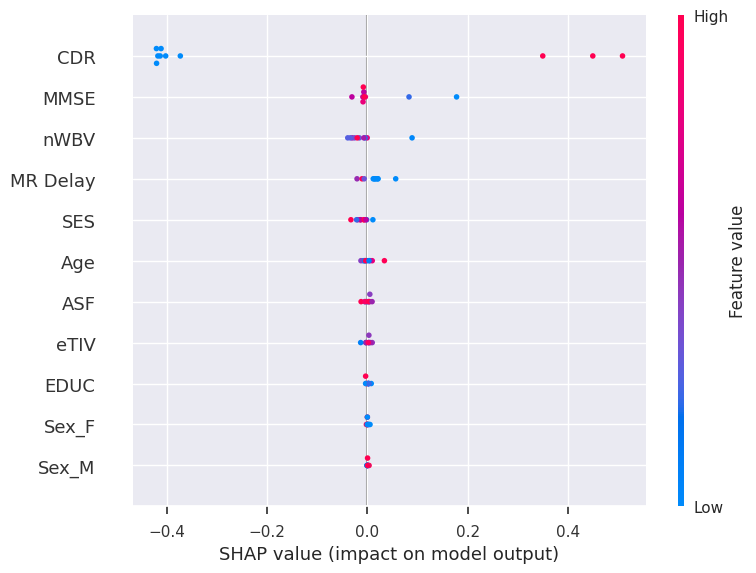

In [ ]:
shap.initjs()
shap.summary_plot(shap_values, X)

Higher amount of CDR have a much positive impact on determing if the patient has dementia or not.

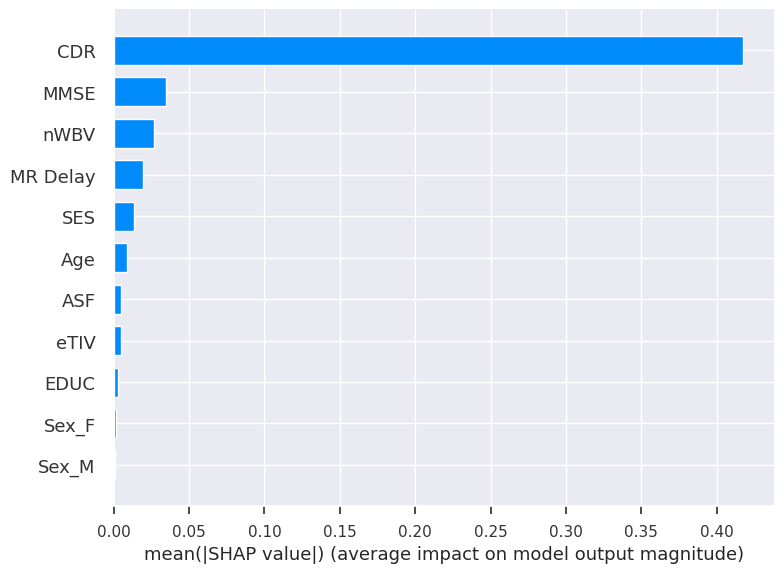

In [ ]:
shap.summary_plot(shap_values, X_train, plot_type="bar")

For the linear model, MMSE is the second most important feature and for our tree-based model MMSE is the second most important feature when we consider the average of SHAP values to calculate feature importance.

Permutation explainer: 299it [00:34,  7.07it/s]


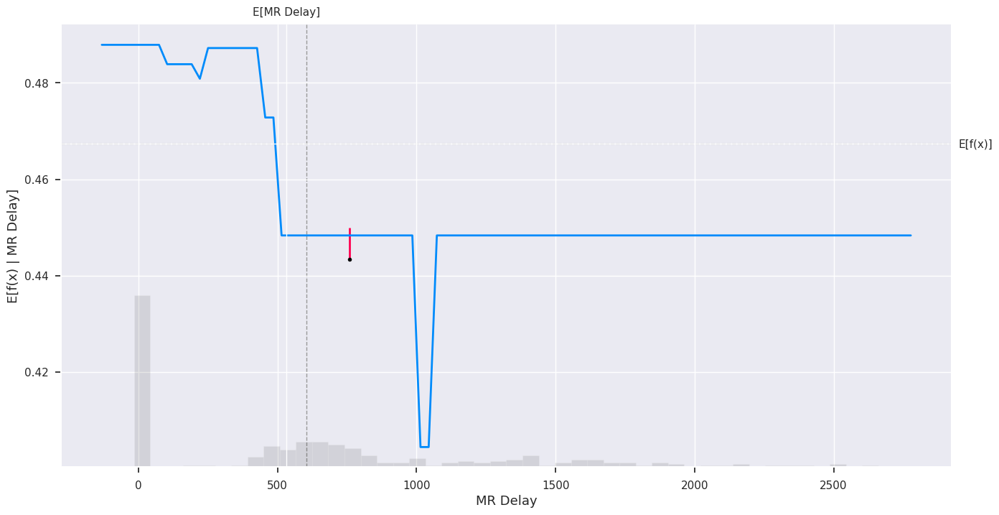

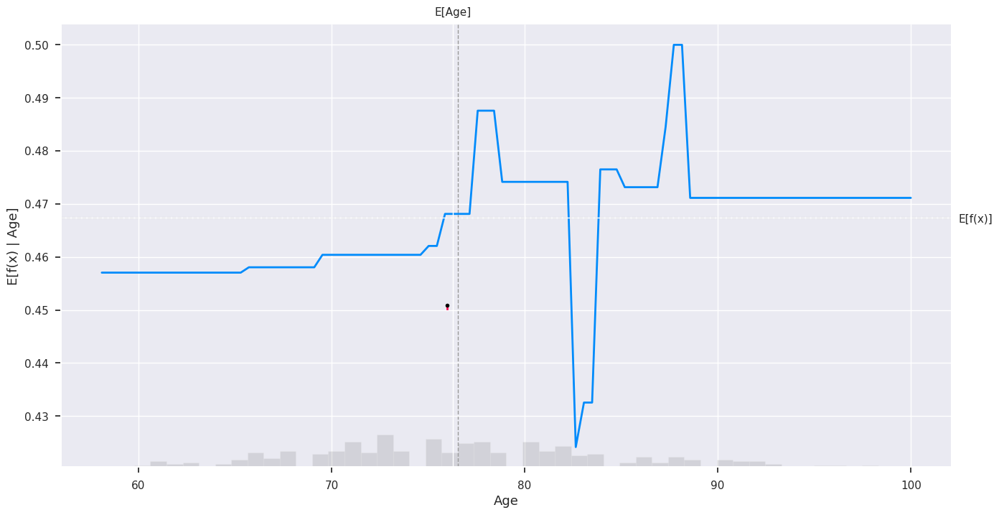

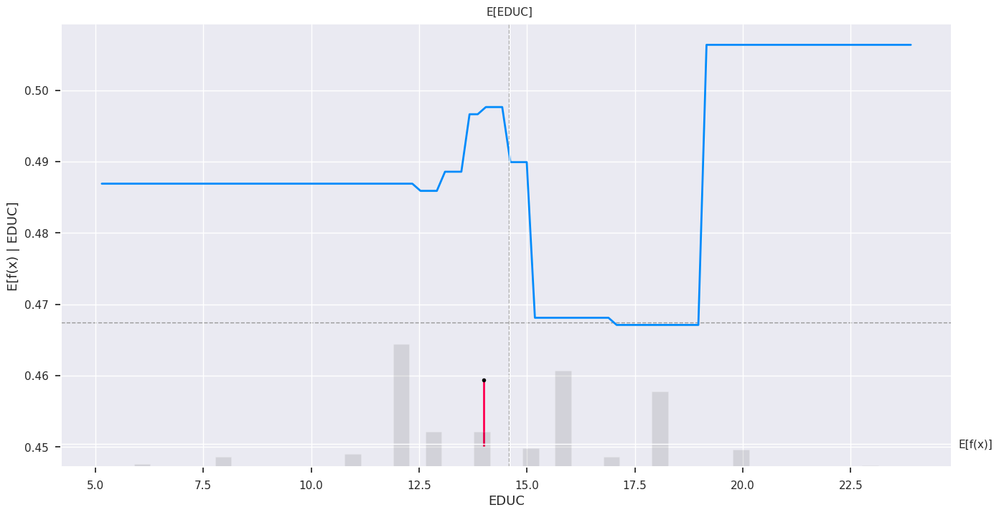

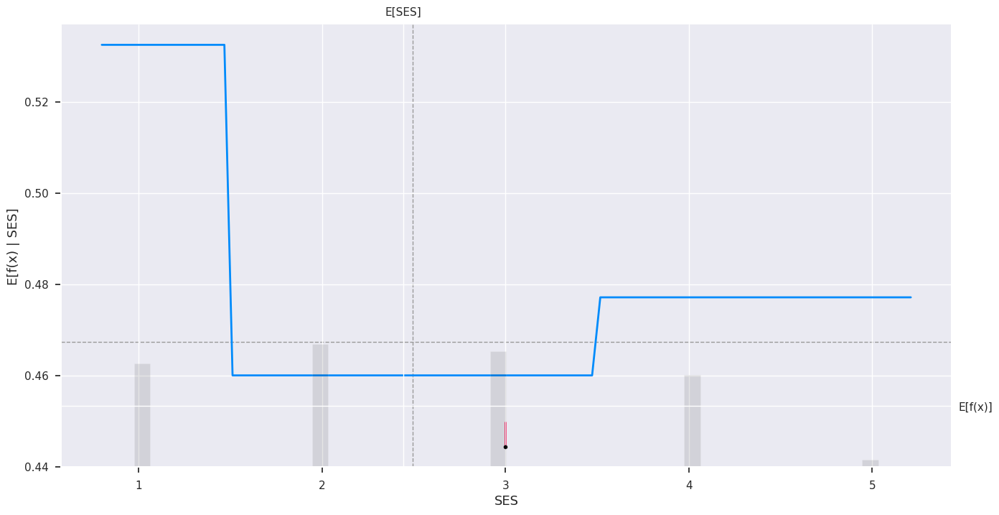

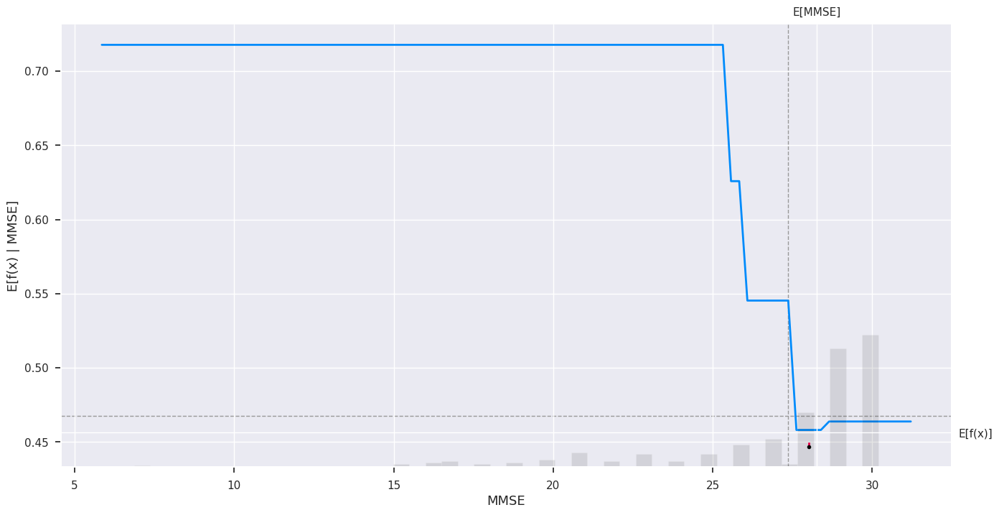

...

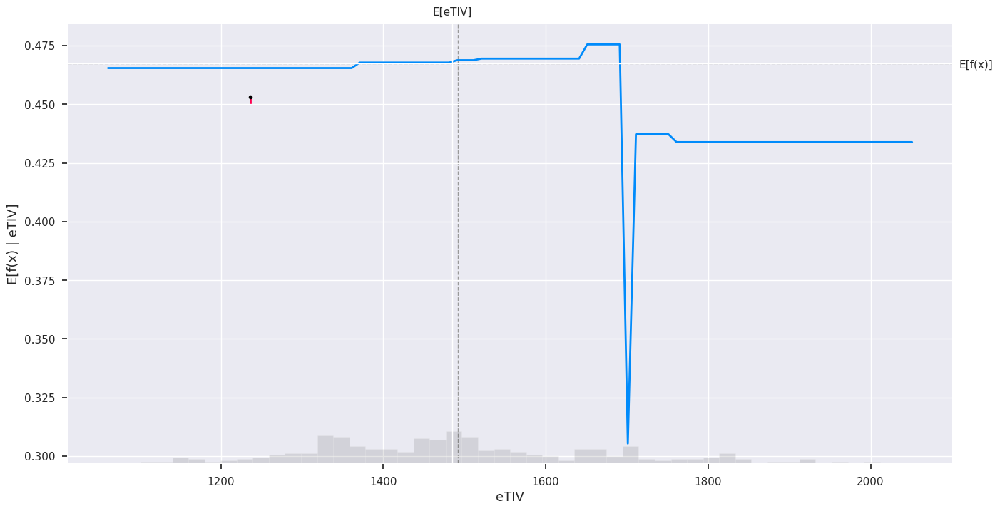

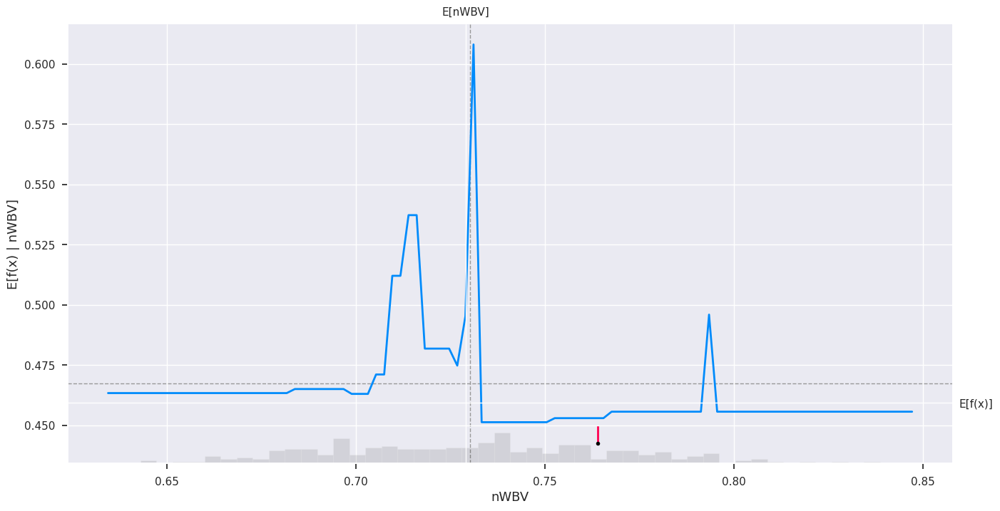

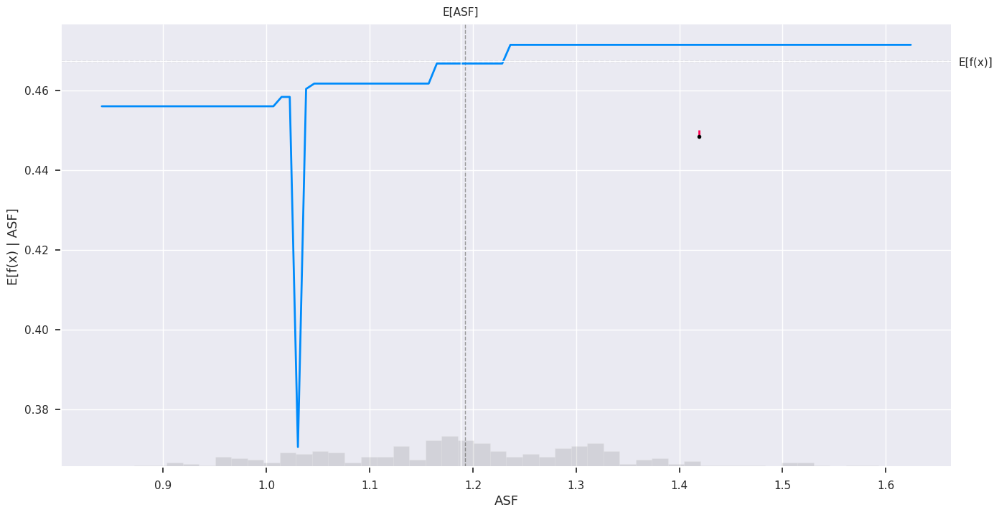

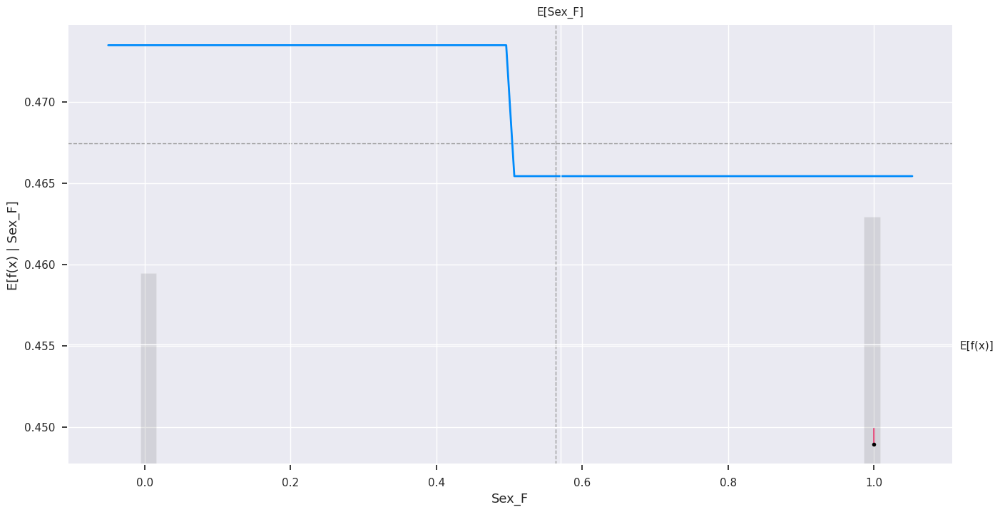

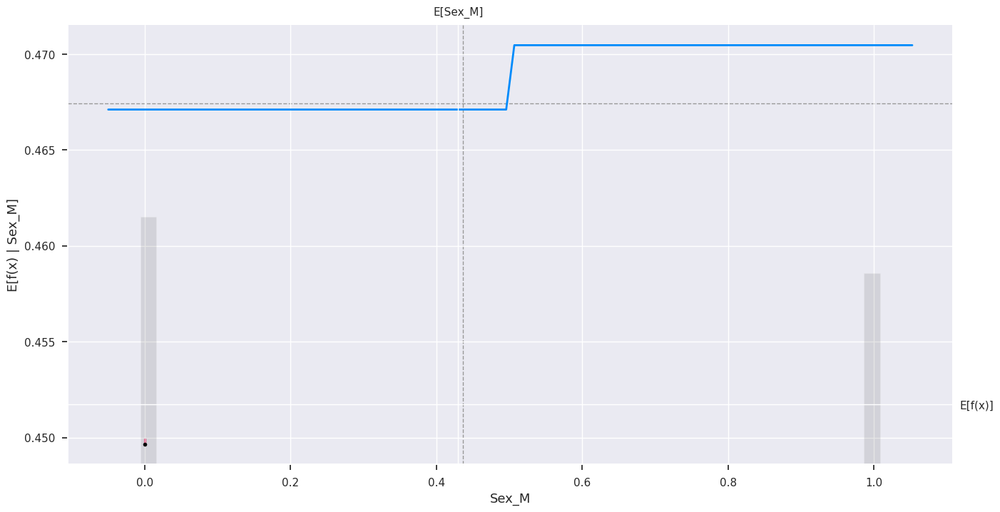

In [ ]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(model_rf1.predict, X_train)
tree_shap_values = tree_explainer(X_train)
for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        model_rf1.predict,
        X_train,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

In [ ]:
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

NameError: ignored

The above graph shows that CDR has the biggest and most positive impact in determing if the person has dementia or not by 0.56 for this specific sample. Preceding by MR Delay which has a negative impact and it bought the prediction down again by 0.01 for this sample, and so on.

# LIME (Local Interpretation Model-Agnostic Explanation) Analysis

Let us Interpret our Linear model and Tree-based model on sample data (sample_index = 18) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models

* As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative
* Here for this sample as seen below CDR, eTIV, EDUC and SES harmed both linear and tree-based model
* age, sex_M and MR Delay had a positive effect on determing if person has dementia or not

##Linear Model

In [ ]:
# Initializing LIME explainer for Linear Model
lime_linear_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train), feature_names=X_train.columns, mode="regression"
)

In [ ]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(X_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_reg.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_reg.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [0.88020746]
Actual :      0


In [ ]:
lime_linear_explanation.show_in_notebook()  # Display Results in Notebook

#Tree Based Model

In [ ]:
# Initializing LIME explainer for Tree Based Model
lime_tree_explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train), feature_names=X_train.columns, mode="regression"
)


In [ ]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(X_test)
np_y_test = np.array(y_test)
print("Prediction : ", model_rf1.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], model_rf1.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

Prediction :  [1.]
Actual :      0


In [ ]:
lime_tree_explanation.show_in_notebook()  # Display Results in Notebook


# PDP(Partial Dependence Plot) for Linear model and Tree-based Model

1. Linear Model - If we closely look at the PDP of the linear model we can see that if features CDR, eTIV, EDUC are tuned while freezing the rest if them the output of the model varies linearly and these variables have the most significant effect on the output(detecting Early Alzheimer)
2. Tree-Based Model - On looking at the PDP of the tree-based model, it re-affirms the interpretation we got from the PDP of the Linear Model and Best AutoML model. The only difference here is that the output doesn't vary linearly

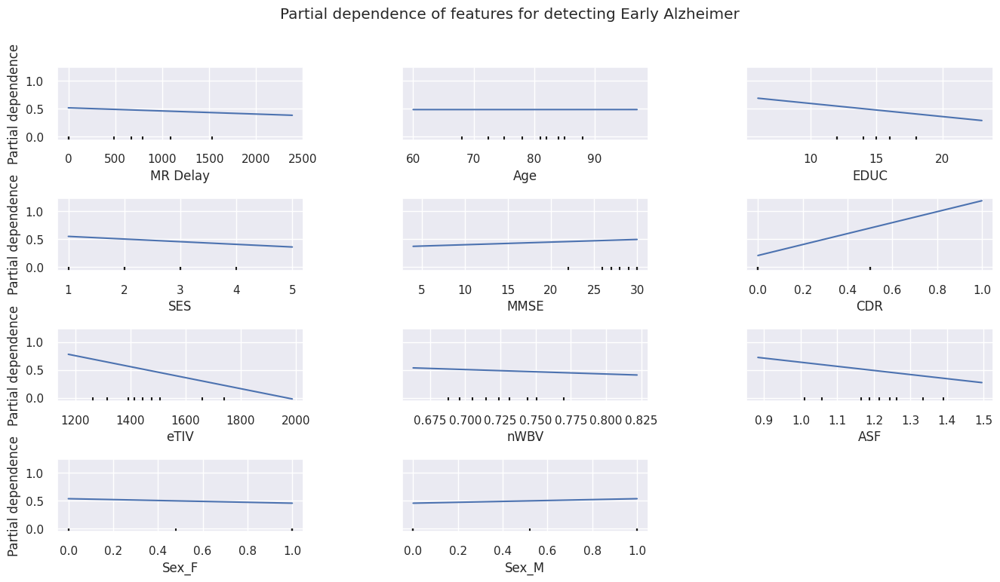

In [ ]:
# PDP Plot for Linear Model
PartialDependenceDisplay.from_estimator(linear_reg, X_test, X_test.columns )

fig = plt.gcf()
fig.suptitle("Partial dependence of features for detecting Early Alzheimer")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

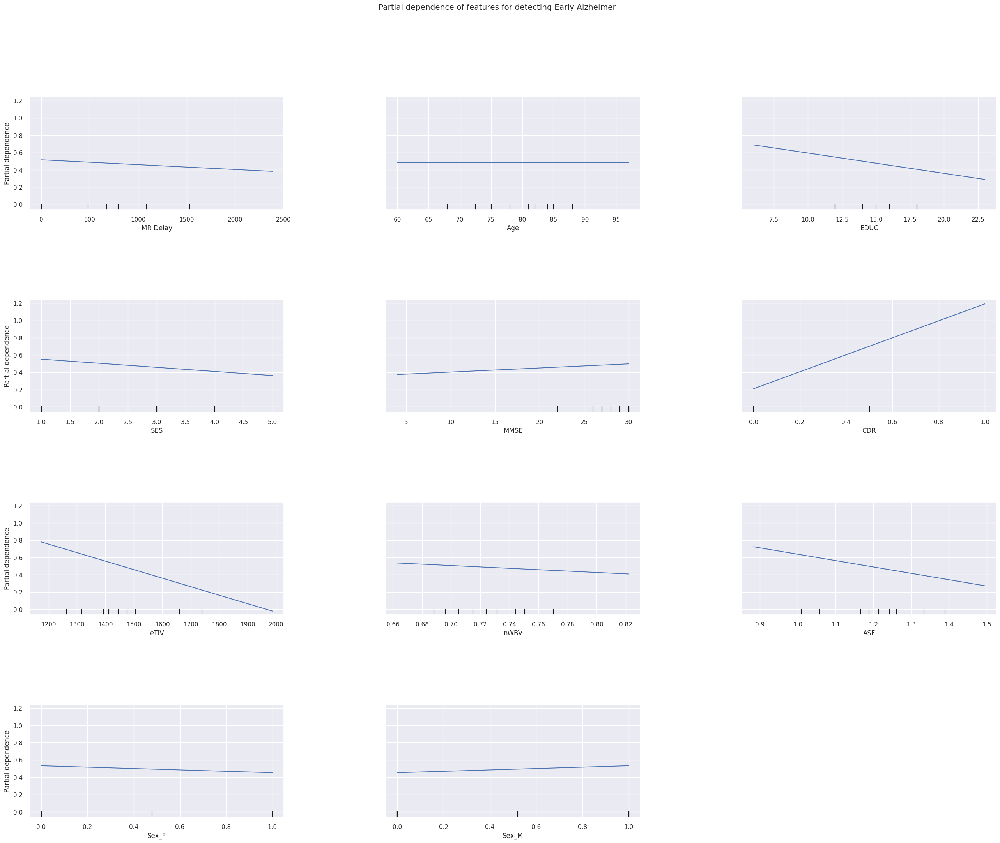

In [ ]:
# PDP Plot for Linear Model
PartialDependenceDisplay.from_estimator(linear_reg, X_test, X_test.columns )

fig = plt.gcf()
fig.suptitle("Partial dependence of features for detecting Early Alzheimer")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

#Conclusion

When a classifier like Random Forest was implemented on this dataset it gave a better accuracy. The accuracy on training data was 97.7 percent. On the other hand when Linear Regression was imolemented the accuracy for training data was 66.2 percent. After implementing these model I calculated SHAP values using SHAP analysis method. I plotted different plots like summary plot, waterfall plot, force plot, feature importance bar chart and many more plots.

For each model, the important feature obtained were different. Among all these 3 models the best accuracy was obtained for random forest model.The important features for this model were Clinical Dementia Rating (CDR), Estimated Total Intracranial Volume (eTIV), and Atlas Scaling Factor (ASF). This means that for this model the target variable 'Group' is highly depended on Clinical Dementia Rating (CDR).

#1. What is the question?

The question is to perform a data analysis on the Early Alzheimer's detection dataset to determine the data types, identify missing values, evaluate the distribution of numeric variables, select independent variables useful in predicting the target variable, determine the importance of predictor variables, interpret the regression coefficients, interpret the nodes of a tree-based model, use AutoML to find the best model, and interpret the models using SHAP analysis.


#2. What did you do?

I performed the following tasks on the Spotify popularity prediction dataset:

* Conducted data cleaning and feature selection.
* Identified the data types and missing values in the dataset.
* Evaluated the likely distributions of the numeric variables.
* Used at least three methods to select independent variables useful in predicting the target variable.
* Identified the independent variables that have missing data and determined the percentage of missing values.
* Checked if the training and test sets have the same data and if predictor variables are independent of each other.
* Determined the importance of predictor variables and checked if the ranges of predictor variables make sense.
* Checked the distributions of predictor variables and evaluated the impact of removing outliers.
* Removed 1%, 5%, and 10% of the data randomly and imputed the values using at least three imputation methods to check how well the methods recovered missing values.
* Used AutoML library like H2O.ai to create predictive models and interpret them.
* Interpreted the regression coefficients of the linear model.
* Interpreted the nodes of the tree-based model.
* Used SHAP analysis to interpret the models and compare them with other model interpretability methods.


#3. How well did it work?

* The analysis performed on the Early Alzheimer's detection dataset yielded useful insights and information.
* The data cleaning and feature selection tasks helped to identify the data types, missing values, and useful independent variables.
* The evaluation of the distribution of numeric variables and the selection of independent variables using different methods provided a better understanding of the dataset.
* The analysis of missing data, checking the independence of predictor variables, determining the importance of predictor variables, and evaluating the impact of removing outliers helped to make informed decisions.
* The use of AutoML library like H2O.ai to create predictive models and interpret them provided useful insights.
* The interpretation of the regression coefficients, nodes of the tree-based model, and SHAP analysis helped to understand the models better and compare them with other interpretability methods.

#4. What did you learn?

From this analysis, I learnt that

* data cleaning and feature selection are crucial in ensuring the quality of the data and identifying useful variables.
* It is essential to evaluate the distribution of numeric variables and select independent variables using different methods.
* I learned how to handle missing data, check the independence of predictor variables, determine the importance of predictor variables, and evaluate the impact of removing outliers.
* Using AutoML libraries like H2O.ai can help in creating predictive models and interpret them.
* I learned how to interpret the regression coefficients, nodes of the tree-based model, and SHAP analysis to understand the models better and compare them with other interpretability methods.


#Conclusion/ Final Outcome

The analysis performed on the Early Alzheimer's detection dataset was successful in providing useful insights and information. The data cleaning and feature selection tasks helped in identifying the data types, missing values, and useful independent variables. The evaluation of the distribution of numeric variables and the selection of independent variables using different methods provided a better understanding of the dataset. The analysis of missing data, checking the independence of predictor variables, determining the importance of predictor variables, and evaluating the impact of removing outliers helped to make informed decisions. Using AutoML libraries like H2O.ai to create predictive models and interpret them provided useful insights, and the interpretation of the regression coefficients, nodes of the tree-based model, and SHAP analysis helped to understand the models better and compare them with other interpretability methods. Overall, the assignment provided a comprehensive understanding of data analysis techniques and their applications in predictive learning.

# MIT License

Copyright (c) 2023 Anushka Rajesh Darade

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

# References

* https://scikit-learn.org/stable/

* https://towardsdatascience.com/

* https://www.kaggle.com/

* https://www.kaggle.com/code/artgor/eda-and-models

* https://eli5.readthedocs.io/en/latest/

*   https://docs.h2o.ai/h2o/latest-stable/h2o-docs/grid-search.html
*   https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d
* https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Full_ML_Report/Wine-Quality-Analysis.ipynb

